In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from bs4 import BeautifulSoup
import torchvision
from torchvision import transforms, datasets, models
import torch
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from PIL import Image
import matplotlib.pyplot as plt
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
import matplotlib.patches as patches

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 5GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session


import datetime
from pathlib import Path
from torch.utils.tensorboard import SummaryWriter
import sys


In [2]:

def generate_box(obj):
    
    xmin = int(obj.find('xmin').text)
    ymin = int(obj.find('ymin').text)
    xmax = int(obj.find('xmax').text)
    ymax = int(obj.find('ymax').text)
    
    return [xmin, ymin, xmax, ymax]


def generate_label(obj):
    if obj.find('name').text == "with_mask": 
        return 2 
    elif obj.find('name').text == "mask_weared_incorrect": 
        return 3 
    return 1

# def generate_label(obj):
#     if obj.find('name').text == "with_mask":
#         return 1
#     elif obj.find('name').text == "mask_weared_incorrect":
#         return 2
#     return 0

def generate_target(image_id, file): 
    with open(file) as f:
        data = f.read()
        soup = BeautifulSoup(data, 'xml')
        objects = soup.find_all('object')

        num_objs = len(objects)

        # Bounding boxes for objects
        # In coco format, bbox = [xmin, ymin, width, height]
        # In pytorch, the input should be [xmin, ymin, xmax, ymax]
        boxes = []
        labels = []
        for i in objects:
            boxes.append(generate_box(i))
            labels.append(generate_label(i))
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # Labels (In my case, I only one class: target class or background)
        labels = torch.as_tensor(labels, dtype=torch.int64)
        # Tensorise img_id
        img_id = torch.tensor([image_id])
        # Annotation is in dictionary format
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["image_id"] = img_id
        
        return target


In [3]:
imgs = list(sorted(os.listdir("dataset/images")))

In [4]:
labels = list(sorted(os.listdir("dataset/annotations/")))

In [7]:
class MaskDataset(object):
    def __init__(self, transforms):
        self.transforms = transforms
        # load all image files, sorting them to
        # ensure that they are aligned
        self.imgs = list(sorted(os.listdir("dataset/images/")))
#         self.labels = list(sorted(os.listdir("/kaggle/input/face-mask-detection/annotations/")))

    def __getitem__(self, idx):
        # load images ad masks
        file_image = 'maksssksksss'+ str(idx) + '.png'
        file_label = 'maksssksksss'+ str(idx) + '.xml'
        img_path = os.path.join("dataset/images/", file_image)
        label_path = os.path.join("dataset/annotations/", file_label)
        img = Image.open(img_path).convert("RGB")
        #Generate Label
        target = generate_target(idx, label_path)
        
        if self.transforms is not None:
            img = self.transforms(img)

        return img, target

    def __len__(self):
        return len(self.imgs)

In [8]:
data_transform = transforms.Compose([
        transforms.ToTensor(), 
    ])

In [24]:
def collate_fn(batch):
    return tuple(zip(*batch))

dataset = MaskDataset(data_transform)
samples = []

for i in range(len(dataset)):
    samples.append(dataset[i])

    
# REMOVE/COMMENT THE BELOW STATEMENT
# samples = samples[:10]
    
train_size = int(0.9*len(samples))
samples_train = samples[:train_size]
samples_val = samples[train_size:]

train_data_loader = torch.utils.data.DataLoader(
 samples_train, batch_size=2, collate_fn=collate_fn)

val_data_loader = torch.utils.data.DataLoader(
 samples_val, batch_size=2, collate_fn=collate_fn)

In [21]:
len(train_data_loader)

5

In [11]:
torch.cuda.is_available()

True

# Model

In [12]:
def get_model_instance_segmentation(num_classes):
    # load an instance segmentation model pre-trained pre-trained on COCO
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
    # get number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes+1)

    return model

In [13]:
model = get_model_instance_segmentation(3)

In [14]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
# for imgs, annotations in data_loader:
#     imgs = list(img.to(device) for img in imgs)
#     annotations = [{k: v.to(device) for k, v in t.items()} for t in annotations]
#     print(annotations)
#     break

# Train Model

In [15]:
def get_filename(time: int, util_name:str =""):   
    filename = str(time.strftime('%b-%d-%Y_%H-%M-%S'))
    if util_name != "":
        filename = util_name+"_"+filename
    return filename

In [16]:
# model = get_model_instance_segmentation(3)
# model.load_state_dict(torch.load('saves/Dec-01-2020_03-16-02/model_5_epochs.pt'))

In [22]:
time = datetime.datetime.now()
saves_dir = os.path.join('saves', get_filename(time))
Path(saves_dir).mkdir(parents=True, exist_ok=True)

summ_filename = os.path.join(saves_dir,'tensorboard_summary')
writer = SummaryWriter(summ_filename)

num_epochs = 1
model.to(device)
    
# parameters
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,
                                momentum=0.9, weight_decay=0.0005)

len_train_dataloader = len(train_data_loader)

best_val_loss = sys.maxsize
best_epoch = -1

for epoch in range(num_epochs):
    i = 0    
    epoch_loss = []
    val_epoch_loss = []
    print("Epoch:", epoch)
    
    model.train()
    
    train_iou_vals = []
    
    for imgs, annotations in train_data_loader:
        i += 1
        imgs = list(img.to(device) for img in imgs)
        annotations = [{k: v.to(device) for k, v in t.items()} for t in annotations]
        loss_dict = model(imgs, annotations)
        print("train:", loss_dict)
        
        # loss_dict consists of multiple losses such as classification loss, bounding box loss, and two other losses.
        losses = sum([loss for loss in loss_dict.values()])

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()         
#         print(f'Iteration: {i}/{len_dataloader}, Loss: {losses}')

        epoch_loss.append(losses.detach().cpu().numpy())
    
    with torch.no_grad():
        for imgs, annotations in val_data_loader:
#             print(len(imgs), len(annotations))
            imgs = list(img.to(device) for img in imgs)
            annotations = [{k: v.to(device) for k, v in t.items()} for t in annotations]
            loss_dict = model(imgs, annotations)
#             print(len(loss_dict))
#             print("val:",loss_dict)

            losses = sum([loss for loss in loss_dict.values()])

            val_epoch_loss.append(losses.detach().cpu().numpy())
    
    torch.save(model.state_dict(),os.path.join(saves_dir, 'model_'+str(epoch)+'_epochs.pt'))
    avg_epoch_loss = np.mean(epoch_loss)
    avg_val_epoch_loss = np.mean(val_epoch_loss)
    writer.add_scalars("losses", {
        "avg_training_loss": avg_epoch_loss,
        "avg_val_loss": avg_val_epoch_loss
    }, epoch)
#     writer.add_scalar("avg_val_loss", avg_val_epoch_loss, epoch)
    
    print("Avg training loss:", avg_epoch_loss)
    print("Avg validation loss:", avg_val_epoch_loss)
    
    
    if avg_val_epoch_loss<best_val_loss:
        best_val_loss=avg_val_epoch_loss
        best_epoch = epoch
        
print("===================================")        
print("Best model details:")
print("Epoch:", best_epoch)
print("Min validation loss:", best_val_loss)

Epoch: 0
train: {'loss_classifier': tensor(1.6360, device='cuda:0', grad_fn=<NllLossBackward>), 'loss_box_reg': tensor(0.1055, device='cuda:0', grad_fn=<DivBackward0>), 'loss_objectness': tensor(0.2098, device='cuda:0', grad_fn=<BinaryCrossEntropyWithLogitsBackward>), 'loss_rpn_box_reg': tensor(0.0678, device='cuda:0', grad_fn=<DivBackward0>)}
train: {'loss_classifier': tensor(0.8385, device='cuda:0', grad_fn=<NllLossBackward>), 'loss_box_reg': tensor(0.1264, device='cuda:0', grad_fn=<DivBackward0>), 'loss_objectness': tensor(0.1855, device='cuda:0', grad_fn=<BinaryCrossEntropyWithLogitsBackward>), 'loss_rpn_box_reg': tensor(0.0426, device='cuda:0', grad_fn=<DivBackward0>)}
train: {'loss_classifier': tensor(0.3217, device='cuda:0', grad_fn=<NllLossBackward>), 'loss_box_reg': tensor(0.1479, device='cuda:0', grad_fn=<DivBackward0>), 'loss_objectness': tensor(0.0566, device='cuda:0', grad_fn=<BinaryCrossEntropyWithLogitsBackward>), 'loss_rpn_box_reg': tensor(0.0115, device='cuda:0', grad_

In [ ]:
# for imgs, annotations in data_loader:
#         imgs = list(img.to(device) for img in imgs)
#         annotations = [{k: v.to(device) for k, v in t.items()} for t in annotations]
#         break

In [ ]:
# model.eval()
# preds = model(imgs)
# preds

# Function to plot image

In [19]:
def plot_image(img_tensor, annotation):
    
    fig,ax = plt.subplots(1)
    img = img_tensor.cpu().data

    # Display the image
    ax.imshow(img.permute(1, 2, 0))
    
    for box in annotation["boxes"]:
        xmin, ymin, xmax, ymax = box

        # Create a Rectangle patch
        rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='r',facecolor='none')

        # Add the patch to the Axes
        ax.add_patch(rect)

    plt.show()

In [17]:
def plot_image_new(img_tensor, annotation, block=True):
#     print(annotation)
    fig,ax = plt.subplots(1)
    img = img_tensor.cpu().data
    # Display the image
    ax.imshow( np.array( img.permute(1, 2, 0) ) )

    for box, label in zip( annotation["boxes"], annotation["labels"] ):
#         print("label",label)
#         print("box",box)
        xmin, ymin, xmax, ymax = box
        # Create a Rectangle patch
        if label==1:
            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='b',facecolor='none')
        else:
            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='r',facecolor='none')
        # Add the patch to the Axes
        ax.add_patch(rect)
        ax.axis("off")
    plt.show(block=block)

In [18]:
# print("Prediction")
# plot_image(imgs[2], preds[2])
# print("Target")
# plot_image(imgs[2], annotations[2])

In [43]:
torch.save(model.state_dict(),'model.pt')

In [15]:
model2 = get_model_instance_segmentation(3)

# Save Model

In [16]:
model2.load_state_dict(torch.load('model_15_epochs.pt'))
model2.eval()
model2.to(device)

FasterRCNN(
  (transform): GeneralizedRCNNTransform()
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d()
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d()
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d()
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d()
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d()
          )
  

# Load Model

In [17]:
pred2 = model2(imgs)

Predict with loaded model


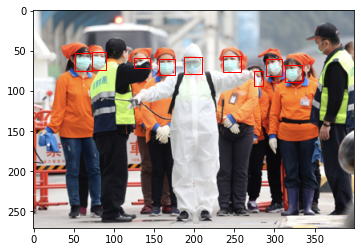

In [18]:
print("Predict with loaded model")
plot_image(imgs[3], pred2[3])

In [39]:
img_path = "sample_images/sample_input_wo_mask.jpg"
# label_path = os.path.join("dataset/annotations/", file_label)
img_sample_input = Image.open(img_path).convert("RGB")
#Generate Label
# target = generate_target(idx, label_path)

if data_transform is not None:
    img_sample_input = data_transform(img_sample_input)

In [40]:
# img_sample_input = torch.unsqueeze(img_sample_input, 0).to(device)
# img_sample_input.shape

torch.Size([1, 3, 720, 1080])

In [41]:
img_sample_input = torch.unsqueeze(img_sample_input, 0).to(device)
pred_sample_input = model2(img_sample_input)

Predict sample image with loaded model


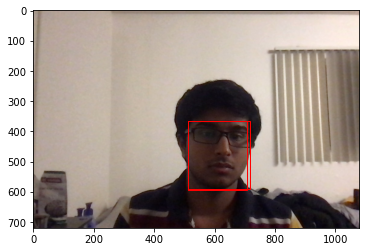

In [42]:
print("Predict sample image with loaded model")
plot_image(img_sample_input[0], pred_sample_input[0])

In [17]:
# img_path = "sample_images/sample_input_wo_mask.jpg"
# img_path = "sample_images/mask_only_2.jpg"
img_path = "sample_images/3.jpg"
# label_path = os.path.join("dataset/annotations/", file_label)
img_sample_input = Image.open(img_path).convert("RGB")
print(img_sample_input.size)
#Generate Label
# target = generate_target(idx, label_path)

if data_transform is not None:
    img_sample_input = data_transform(img_sample_input)
    
img_sample_input = torch.unsqueeze(img_sample_input, 0).to(device)
print(img_sample_input.shape)

(405, 442)
torch.Size([1, 3, 442, 405])


[{'boxes': tensor([[104.5182, 136.7035, 241.7958, 348.8611],
        [404.9615,   5.1595, 405.0000,  11.6938],
        [404.9615,   5.1712, 405.0000,  11.7033],
        [404.9614,   5.1412, 405.0000,  11.6711]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 2, 1, 3], device='cuda:0'), 'scores': tensor([0.9974, 0.1672, 0.1578, 0.1291], device='cuda:0',
       grad_fn=<IndexBackward>)}]
Predict sample image with loaded model
{'boxes': tensor([[104.5182, 136.7035, 241.7958, 348.8611],
        [404.9615,   5.1595, 405.0000,  11.6938],
        [404.9615,   5.1712, 405.0000,  11.7033],
        [404.9614,   5.1412, 405.0000,  11.6711]], device='cuda:0',
       grad_fn=<StackBackward>), 'labels': tensor([1, 2, 1, 3], device='cuda:0'), 'scores': tensor([0.9974, 0.1672, 0.1578, 0.1291], device='cuda:0',
       grad_fn=<IndexBackward>)}
label tensor(1, device='cuda:0')
box tensor([104.5182, 136.7035, 241.7958, 348.8611], device='cuda:0',
       grad_fn=<SelectBackward>)
l

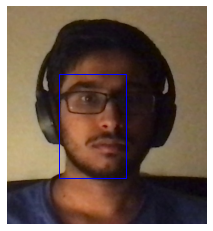

In [21]:
model3 = get_model_instance_segmentation(3)
model3.load_state_dict(torch.load('saves/Dec-01-2020_04-47-26/model_9_epochs.pt'))
model3.eval()
model3.to(device)
pred_sample_input = model3(img_sample_input)
print(pred_sample_input)
print("Predict sample image with loaded model")
plot_image_new(img_sample_input[0], pred_sample_input[0])

In [19]:
def get_iou(bb1, bb2):
    """
    Calculate the Intersection over Union (IoU) of two bounding boxes.

    Parameters
    ----------
    bb1 : dict
        Keys: {'x1', 'x2', 'y1', 'y2'}
        The (x1, y1) position is at the top left corner,
        the (x2, y2) position is at the bottom right corner
    bb2 : dict
        Keys: {'x1', 'x2', 'y1', 'y2'}
        The (x, y) position is at the top left corner,
        the (x2, y2) position is at the bottom right corner

    Returns
    -------
    float
        in [0, 1]
    """
    bb1 = [val.detach().cpu().numpy() for val in bb1]
    bb2 = [val.detach().cpu().numpy() for val in bb2]
#     print(bb1, bb2)
#     print(bb1[0], bb1[1])
    assert bb1[0] < bb1[2]
    assert bb1[1] < bb1[3]
    assert bb2[0] < bb2[2]
    assert bb2[1] < bb2[3]

    # determine the coordinates of the intersection rectangle
    x_left = max(bb1[0], bb2[0])
    x_right = min(bb1[2], bb2[2])
    y_top = max(bb1[1], bb2[1])
    y_bottom = min(bb1[3], bb2[3])

    if x_right < x_left or y_bottom < y_top:
        return 0.0

    # The intersection of two axis-aligned bounding boxes is always an
    # axis-aligned bounding box
    intersection_area = (x_right - x_left) * (y_bottom - y_top)

    # compute the area of both AABBs
    bb1_area = (bb1[2] - bb1[0]) * (bb1[3] - bb1[1])
    bb2_area = (bb2[2] - bb2[0]) * (bb2[3] - bb2[1])

    # compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the interesection area
    iou = intersection_area / float(bb1_area + bb2_area - intersection_area)
#     print(iou)
#     if iou>=0.0 and iou<=1.0:
#         return iou, True
#     else:
#         return iou, False
    assert iou >= 0.0
    assert iou <= 1.0
    return iou
    


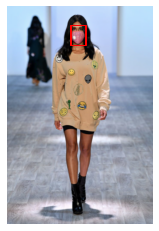

{'boxes': tensor([[116.6939,  34.3755, 142.5466,  70.8698],
        [115.8685,  33.2641, 143.6656,  70.3666]], device='cuda:0'), 'labels': tensor([2, 3], device='cuda:0'), 'scores': tensor([0.9848, 0.2048], device='cuda:0')}
{'boxes': tensor([[347.5656, 107.8200, 431.4607, 212.6450]], device='cuda:0'), 'labels': tensor([2], device='cuda:0'), 'image_id': tensor([767], device='cuda:0')}


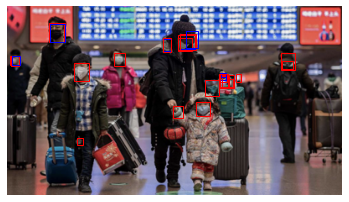

{'boxes': tensor([[127.0113,  55.1079, 139.8781,  70.2382],
        [225.2568, 113.7741, 242.3106, 130.8818],
        [ 79.6505,  67.1697,  96.8996,  88.1236],
        [ 50.0754,  20.1039,  67.6229,  41.3812],
        [  3.8975,  58.6720,  13.6900,  70.0873],
        [253.2636,  82.3244, 263.9660,  96.3000],
        [203.8298,  37.0182, 220.5918,  53.2217],
        [204.0312,  33.6639, 223.8411,  51.8023],
        [236.0759,  87.8987, 253.0640, 106.0601],
        [327.3440,  64.1401, 341.3779,  73.8899],
        [254.3324,  79.0520, 261.3212,  87.4123],
        [ 82.4717, 157.2000,  90.6482, 165.5813],
        [272.2850,  80.1034, 278.8807,  89.8664],
        [197.4262, 118.9425, 209.5237, 133.0681],
        [206.1060,  32.5294, 225.0602,  49.9908],
        [  3.4388,  58.0937,  15.1309,  69.7326],
        [185.2662,  37.9078, 195.6562,  52.6290],
        [206.5214,  32.1923, 225.1879,  51.9598],
        [264.6278,  86.5873, 268.8814,  95.3786],
        [ 49.8516,  19.7622,  68.9127,  

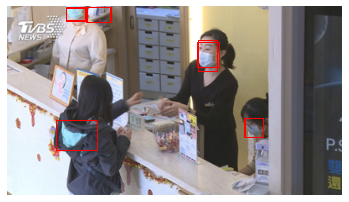

{'boxes': tensor([[ 69.9317,   0.0000,  92.2571,  16.8016],
        [282.9670, 133.2449, 305.0166, 155.4692],
        [226.9725,  40.0245, 250.4826,  76.1670],
        [ 94.0828,   0.0000, 123.2496,  17.8423],
        [226.1342,  41.8511, 252.3438,  71.6115],
        [283.5625, 132.4459, 305.6499, 155.7034],
        [ 58.3853, 134.8393, 106.5367, 171.1374],
        [ 95.2231,   0.0000, 122.7571,  17.7846],
        [ 69.9501,   0.9081,  93.6259,  15.6660]], device='cuda:0'), 'labels': tensor([2, 2, 2, 2, 3, 3, 2, 3, 3], device='cuda:0'), 'scores': tensor([0.9612, 0.9429, 0.9345, 0.8313, 0.2697, 0.1941, 0.1430, 0.0715, 0.0688],
       device='cuda:0')}
{'boxes': tensor([[ 756.4775,  143.1422,  839.7900,  252.9956],
        [ 936.4325,  439.4133, 1026.4100,  519.3066]], device='cuda:0'), 'labels': tensor([2, 2], device='cuda:0'), 'image_id': tensor([769], device='cuda:0')}


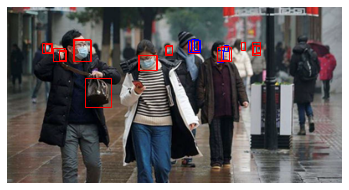

{'boxes': tensor([[ 78.5725,  38.2106,  98.1919,  63.6020],
        [ 44.7948,  43.2364,  51.3228,  52.8779],
        [156.0053,  56.4457, 176.9217,  74.9374],
        [254.5404,  47.2608, 264.4591,  63.0808],
        [188.3554,  46.0938, 196.2527,  56.3474],
        [293.1401,  44.7430, 301.3194,  53.8714],
        [219.1136,  38.2787, 226.9283,  52.0842],
        [278.4831,  40.7599, 284.1808,  51.0969],
        [ 60.8361,  50.6403,  69.2414,  63.3954],
        [ 61.1686,  51.4896,  69.1089,  62.9879],
        [216.7102,  38.3878, 228.0657,  53.9537],
        [250.0289,  50.8750, 256.8304,  64.6831],
        [215.1129,  38.9690, 229.9547,  53.3247],
        [ 92.8298,  84.7583, 123.5681, 118.6578],
        [220.3820,  39.1006, 227.0157,  52.1809],
        [188.6459,  45.4606, 195.9653,  55.6066],
        [296.3336,  45.6628, 301.5240,  52.9565],
        [291.6826,  41.7284, 301.8567,  56.5100],
        [222.8373,  39.0760, 228.1152,  51.3621],
        [ 79.5036,  39.0384,  99.1576,  

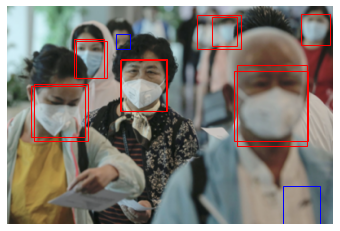

{'boxes': tensor([[ 81.8300,  39.3984, 118.8238,  88.0785],
        [360.3014,   8.5075, 395.4550,  46.7605],
        [ 31.9251,  94.8781,  98.5010, 164.8644],
        [282.2746,  70.9221, 367.4638, 170.4784],
        [139.7318,  63.6726, 195.2569, 128.1454],
        [232.6503,   9.7489, 286.0149,  52.2136],
        [251.3044,  12.5679, 282.0547,  48.0070],
        [132.9979,  33.6004, 150.8248,  52.0058],
        [138.1798,  65.0451, 194.9559, 128.5199],
        [337.8875, 220.2766, 383.1503, 267.0000],
        [ 28.5599,  97.2332,  94.7042, 159.6339],
        [ 84.0459,  42.0400, 122.3075,  87.5554],
        [277.5382,  79.2433, 368.7958, 164.8263]], device='cuda:0'), 'labels': tensor([2, 2, 2, 2, 2, 2, 2, 1, 3, 1, 3, 3, 3], device='cuda:0'), 'scores': tensor([0.9960, 0.9925, 0.9909, 0.9872, 0.9322, 0.9071, 0.3204, 0.2751, 0.2080,
        0.1582, 0.1122, 0.0544, 0.0543], device='cuda:0')}
{'boxes': tensor([[  92.8450,  326.5918,  278.5350,  482.3970],
        [ 248.5850,  128.8390,  

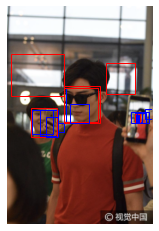

{'boxes': tensor([[ 45.2681, 190.3336,  83.1449, 235.1393],
        [108.5622, 149.7887, 166.1974, 214.0786],
        [235.4257, 195.6899, 246.6557, 212.7605],
        [ 91.8888, 214.8436, 103.5111, 230.6391],
        [103.5176, 149.9941, 166.8640, 212.7375],
        [103.8374, 146.6660, 169.3576, 213.9614],
        [181.3428, 104.3136, 234.7659, 160.8499],
        [233.7645, 199.4888, 239.4345, 212.0852],
        [ 59.9031, 190.8441,  92.3726, 237.8731],
        [252.5718, 188.8160, 265.0024, 207.1072],
        [234.0982, 197.2852, 244.4933, 213.1888],
        [  5.8047,  87.5804, 104.5665, 164.2824],
        [ 43.1666, 185.8597,  91.1928, 238.9117],
        [ 70.7511, 203.7414,  92.2404, 240.2968],
        [237.5943, 194.7851, 254.1530, 214.0115],
        [227.4641, 194.4081, 259.7462, 214.5223],
        [235.9360, 198.5983, 242.3575, 213.2395],
        [114.5077, 179.1594, 150.1748, 213.3080]], device='cuda:0'), 'labels': tensor([1, 1, 1, 1, 3, 2, 2, 1, 1, 1, 3, 2, 3, 1, 1, 1, 1, 1]

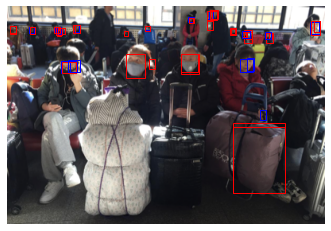

{'boxes': tensor([[148.7026,  59.9509, 173.6110,  90.0761],
        [218.7553,  59.9095, 241.4440,  84.3956],
        [293.2719,  65.3597, 308.7740,  82.8290],
        [300.1782,  31.4855, 307.7496,  41.2284],
        [385.5343,  18.0430, 392.7677,  31.8753],
        [ 82.8181,  22.4147,  90.5427,  31.4777],
        [ 60.1293,  25.5560,  66.7869,  33.2361],
        [253.8082,   5.0733, 263.5283,  15.0896],
        [ 67.7313,  68.9547,  86.4184,  83.1531],
        [301.0946,  64.5051, 310.6335,  80.3479],
        [227.8260,  13.4143, 234.5384,  19.6586],
        [325.2957,  33.1835, 331.7470,  40.8319],
        [325.6838,  33.1908, 334.0369,  46.1605],
        [283.4271, 145.8580, 349.2485, 234.4135],
        [295.4271,  31.9398, 301.5039,  38.0403],
        [ 26.8268,  24.9081,  33.5760,  32.4882],
        [280.8837,  27.2958, 287.1489,  35.0981],
        [ 60.7001,  28.0537,  67.1088,  35.6502],
        [ 79.0740,  69.6047,  87.9082,  82.2769],
        [ 69.0029,  70.1339,  86.6744,  

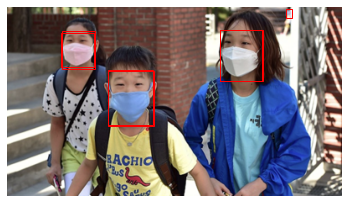

{'boxes': tensor([[ 65.0019,  29.0608, 104.7117,  73.9020],
        [254.2697,  27.4707, 303.3371,  87.7606],
        [120.1017,  76.9855, 174.6286, 142.1809],
        [333.0474,   1.8153, 340.2089,  12.9786],
        [119.5223,  74.9432, 173.4011, 141.5054],
        [254.0406,  26.8834, 304.6737,  88.5708],
        [ 63.3728,  30.9248, 103.4996,  71.3342]], device='cuda:0'), 'labels': tensor([2, 2, 2, 2, 3, 3, 3], device='cuda:0'), 'scores': tensor([0.9700, 0.9624, 0.9544, 0.7936, 0.2567, 0.1468, 0.1127],
       device='cuda:0')}
{'boxes': tensor([[ 219.9450,  106.6195,  346.5800,  239.8938],
        [ 406.5650,  266.5487,  576.5225,  459.7964],
        [ 856.4525,   99.9557, 1003.0825,  286.5398]], device='cuda:0'), 'labels': tensor([2, 2, 2], device='cuda:0'), 'image_id': tensor([774], device='cuda:0')}


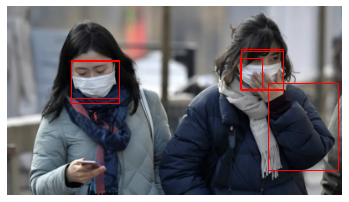

{'boxes': tensor([[ 75.6971,  63.8306, 132.8723, 114.3147],
        [279.0961,  52.9150, 329.1438,  99.5099],
        [ 75.7573,  64.2822, 133.4368, 109.0534],
        [279.3307,  50.5302, 329.1859,  98.1314],
        [311.0544,  91.1931, 394.6347, 194.3049],
        [277.3375,  61.4741, 304.2639,  97.9673]], device='cuda:0'), 'labels': tensor([2, 2, 3, 3, 2, 2], device='cuda:0'), 'scores': tensor([0.9321, 0.8989, 0.3520, 0.3370, 0.1595, 0.0710], device='cuda:0')}
{'boxes': tensor([[ 256.6025,  219.7067,  433.2250,  359.5200],
        [ 923.1025,  176.4311, 1096.3925,  329.5600]], device='cuda:0'), 'labels': tensor([2, 2], device='cuda:0'), 'image_id': tensor([775], device='cuda:0')}


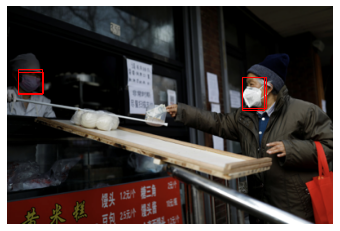

{'boxes': tensor([[288.3672,  86.5626, 315.0321, 126.2491],
        [ 12.4754,  76.3962,  42.4201, 107.3755],
        [ 13.1220,  79.8463,  43.3084, 106.0369],
        [288.1408,  86.3269, 317.2609, 123.9440]], device='cuda:0'), 'labels': tensor([2, 2, 3, 3], device='cuda:0'), 'scores': tensor([0.9921, 0.9908, 0.0686, 0.0657], device='cuda:0')}
{'boxes': tensor([[ 44.9250, 236.7041, 125.7900, 314.6068],
        [862.5599, 263.6704, 949.4150, 380.5244]], device='cuda:0'), 'labels': tensor([2, 2], device='cuda:0'), 'image_id': tensor([776], device='cuda:0')}


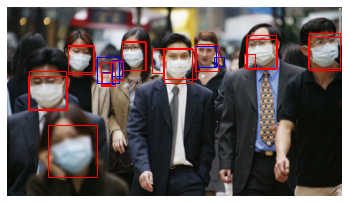

{'boxes': tensor([[ 48.4274, 141.3661, 106.5486, 202.7067],
        [136.4319,  40.0046, 163.9206,  74.8261],
        [ 72.4673,  45.4755, 102.1813,  79.5438],
        [224.3577,  46.8721, 248.8430,  72.2025],
        [359.9744,  30.7679, 397.1401,  75.0202],
        [286.0896,  33.5447, 320.2803,  73.7579],
        [187.2954,  49.4318, 220.3701,  90.1386],
        [ 25.1963,  76.6889,  69.5653, 122.7394],
        [172.4454,  48.7070, 186.0132,  78.3100],
        [113.1875,  77.5502, 124.2562,  91.3979],
        [246.3538,  59.8536, 258.0703,  70.9237],
        [111.7570,  65.9103, 128.3892,  91.8786],
        [185.1930,  49.5613, 225.3040,  85.7576],
        [282.6861,  56.1338, 296.0967,  72.3927],
        [358.8334,  35.1971, 398.9068,  73.2711],
        [ 24.6032,  82.4305,  71.0556, 121.7839],
        [285.1441,  37.7841, 321.6795,  72.2548],
        [223.8289,  44.5671, 250.8371,  76.3957],
        [136.8479,  42.2692, 165.7769,  74.6308],
        [112.6642,  79.0980, 123.8665,  

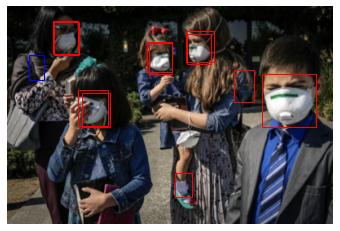

{'boxes': tensor([[ 56.7667,  18.6284,  87.0740,  59.2194],
        [312.5563,  82.0467, 378.9995, 147.6993],
        [173.3727,  44.9190, 201.7466,  82.5215],
        [220.6625,  33.5616, 250.1932,  70.4837],
        [ 90.8294, 106.0858, 125.1928, 147.6023],
        [ 26.4993,  59.0967,  44.1011,  89.8292],
        [ 86.6549, 102.7324, 123.1728, 145.8213],
        [218.7578,  29.6835, 252.9633,  67.5479],
        [204.9412, 204.6544, 226.0495, 233.3654],
        [277.3821,  77.1791, 302.8659, 116.8336],
        [ 56.2251,  17.5055,  86.6527,  57.6470],
        [171.4616,  42.9775, 202.1743,  80.0416]], device='cuda:0'), 'labels': tensor([2, 2, 2, 2, 2, 1, 3, 3, 2, 2, 3, 3], device='cuda:0'), 'scores': tensor([0.9956, 0.9920, 0.9859, 0.9833, 0.9604, 0.1725, 0.1649, 0.1309, 0.0791,
        0.0610, 0.0562, 0.0543], device='cuda:0')}
{'boxes': tensor([[ 170.7150,   62.9213,  263.5600,  176.7790],
        [ 251.5800,  323.5955,  368.3850,  440.4494],
        [ 527.1200,  158.8015,  604.990

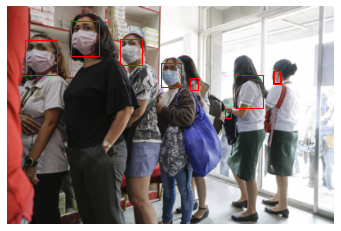

{'boxes': tensor([[137.6819,  38.9614, 164.7198,  71.7629],
        [ 77.2632,  17.9392, 112.3401,  60.5716],
        [188.0990,  68.6774, 211.9600,  98.3121],
        [ 20.7275,  40.6502,  60.6180,  82.8964],
        [326.3686,  79.0132, 334.6381,  93.2790],
        [223.0710,  87.3619, 232.9829, 101.4720],
        [324.8624,  78.7847, 334.0293,  94.1190],
        [325.5882,  78.5466, 333.4442,  94.9380],
        [265.9278, 124.4749, 273.2547, 135.5446],
        [277.6501,  82.9766, 312.4680, 123.3393]], device='cuda:0'), 'labels': tensor([2, 2, 2, 2, 1, 2, 3, 2, 2, 2], device='cuda:0'), 'scores': tensor([0.9954, 0.9951, 0.9931, 0.9912, 0.2339, 0.2012, 0.0816, 0.0609, 0.0570,
        0.0556], device='cuda:0')}
{'boxes': tensor([[  69.1725,  129.3233,  177.4425,  246.6165],
        [ 231.5775,   60.1504,  336.8400,  183.4586],
        [ 418.0425,  123.3083,  490.2225,  213.5338],
        [ 568.4175,  213.5338,  637.5900,  294.7368],
        [ 971.4225,  231.5789, 1007.5125,  291.7293]]

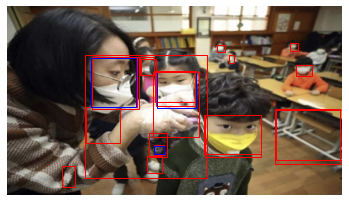

{'boxes': tensor([[344.1129,  68.9044, 364.1775,  82.7914],
        [250.4974,  45.3908, 259.8346,  54.3505],
        [101.0917,  59.8817, 156.9605, 121.8357],
        [159.3291,  61.9684, 176.8188,  81.5744],
        [235.2995, 129.7057, 302.3050, 179.7059],
        [337.6089,  43.5367, 346.7519,  52.2267],
        [319.4926, 121.6948, 397.3703, 187.4402],
        [177.0433,  76.8370, 224.0789, 118.2314],
        [166.3139, 178.7111, 184.0775, 197.9906],
        [101.1878,  61.1437, 154.6541, 120.0609],
        [ 93.0966, 119.9462, 134.4813, 162.5047],
        [176.4793,  76.6942, 224.9905, 114.1435],
        [235.0642, 129.7133, 303.1326, 176.2596],
        [178.1551,  77.2814, 225.5233, 121.2947],
        [175.0870, 165.0736, 187.2870, 177.3435],
        [158.2407,  59.4262, 175.4047,  81.5386],
        [320.9726, 123.0471, 398.9635, 183.3145],
        [174.7055, 165.9832, 187.3120, 176.0493],
        [173.3555,  77.6414, 228.7342, 155.3433],
        [ 65.1376, 189.6040,  80.8291, 2

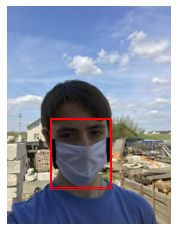

{'boxes': tensor([[ 78.0279, 204.3162, 189.2951, 335.8442],
        [ 80.9212, 206.7956, 189.6019, 331.0583]], device='cuda:0'), 'labels': tensor([2, 3], device='cuda:0'), 'scores': tensor([0.9862, 0.0657], device='cuda:0')}
{'boxes': tensor([[207.3090, 528.8425, 507.6412, 884.9475]], device='cuda:0'), 'labels': tensor([2], device='cuda:0'), 'image_id': tensor([781], device='cuda:0')}


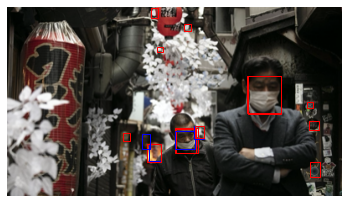

{'boxes': tensor([[168.6507, 163.9873, 183.7722, 183.4359],
        [287.4005,  82.1080, 326.1811, 127.8916],
        [200.1156, 144.7608, 226.9027, 174.3232],
        [200.9513, 145.5517, 225.5693, 174.3185],
        [224.3706, 142.2275, 234.4367, 157.1918],
        [361.3441, 185.3013, 373.4118, 202.8915],
        [286.1465,  81.8603, 326.7018, 126.4801],
        [199.8807, 147.5367, 224.3720, 169.3466],
        [359.7989, 135.7722, 372.2367, 147.1960],
        [137.7386, 150.0612, 146.4494, 160.6148],
        [222.9614, 141.5817, 234.8934, 157.3878],
        [178.3091,  48.0373, 185.3514,  54.1714],
        [165.9428, 163.7001, 183.4792, 185.0350],
        [357.4096, 113.2847, 364.7737, 121.0047],
        [224.1893, 142.4059, 234.3249, 156.8822],
        [211.0116,  20.8006, 218.7062,  29.1230],
        [160.0574, 152.1431, 170.6984, 169.9458],
        [171.1693,   1.5948, 179.3545,  12.7370]], device='cuda:0'), 'labels': tensor([1, 2, 3, 2, 2, 2, 3, 1, 2, 2, 1, 2, 3, 2, 3, 2, 1, 2]

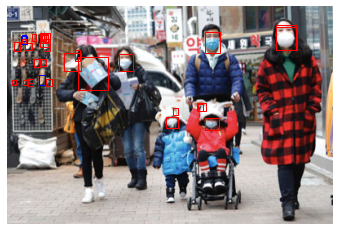

{'boxes': tensor([[241.8565, 136.2845, 260.0172, 151.5019],
        [136.2611,  58.4645, 153.7541,  78.4858],
        [329.2939,  21.9412, 353.7766,  53.2693],
        [241.8249,  30.3738, 261.3044,  56.4919],
        [195.0734, 134.9640, 209.3950, 148.8655],
        [ 86.2741,  61.3839, 122.9196, 102.5588],
        [ 41.5368,  33.8076,  49.5295,  44.1911],
        [ 24.6452,  89.2618,  31.4827,  96.8170],
        [  7.9861,  43.1879,  15.3775,  54.2655],
        [ 21.7235,  44.2190,  29.3835,  53.6644],
        [ 46.8541,  88.8316,  54.1754,  97.0153],
        [ 68.9976,  56.4945,  90.5217,  79.4472],
        [ 43.3838,  39.8340,  51.5580,  53.8598],
        [232.7073, 117.5925, 244.1830, 127.6749],
        [ 32.7927,  63.8272,  39.8707,  74.2860],
        [ 38.8311,  83.7499,  46.2685,  96.5779],
        [ 38.6422,  84.1172,  46.2485,  96.4006],
        [ 42.3933,  35.2726,  47.0150,  42.4494],
        [234.2327, 119.0977, 240.0804, 127.4721],
        [  5.1598,  90.0640,  10.1157,  

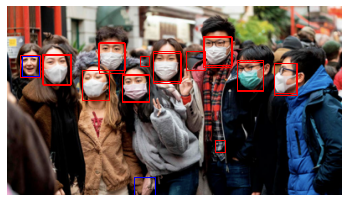

{'boxes': tensor([[ 41.9448,  57.1921,  74.9548,  93.6255],
        [ 88.2705,  75.8412, 121.0120, 110.8870],
        [137.1273,  80.9072, 168.8671, 113.1648],
        [274.5893,  63.8968, 305.6082, 100.7445],
        [108.9088,  41.5830, 139.5841,  78.7574],
        [173.8331,  53.1717, 205.9496,  90.5308],
        [232.8965,  34.5047, 266.6653,  71.5179],
        [ 17.3714,  59.2550,  37.6784,  82.9164],
        [317.9116,  67.2621, 345.3607, 105.5794],
        [212.8938,  52.6849, 236.1658,  75.3574],
        [150.7480, 203.2356, 175.9772, 225.0000],
        [317.7081,  67.3959, 344.7620, 103.4127],
        [247.7659, 158.7171, 260.2969, 172.7692],
        [107.8251,  43.2840, 140.1279,  75.6187],
        [234.6082,  36.3711, 267.7682,  69.0577],
        [ 15.0177,  57.8914,  38.9986,  83.9187],
        [157.5953,  58.9387, 168.7515,  70.6518],
        [274.0884,  65.6203, 305.6929,  99.4693],
        [173.5855,  55.2295, 207.4386,  88.3053],
        [ 40.9543,  56.3509,  76.0858,  

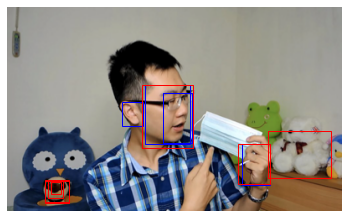

{'boxes': tensor([[136.7847, 113.1371, 162.1091, 142.4185],
        [163.6476,  93.7422, 218.3589, 163.4490],
        [280.4684, 163.1506, 313.7657, 212.8728],
        [311.3925, 148.6617, 385.8439, 203.8092],
        [ 44.1594, 206.2590,  73.9131, 234.6164],
        [160.0473,  92.6163, 220.9603, 168.3501],
        [ 44.5091, 207.9963,  73.1910, 232.4499],
        [ 48.8369, 208.0369,  66.2954, 228.4638],
        [ 51.2801, 209.4709,  63.6100, 223.4871],
        [275.3791, 163.9825, 313.5371, 211.9404],
        [186.1957, 102.9112, 219.9678, 162.1438]], device='cuda:0'), 'labels': tensor([1, 1, 1, 2, 2, 3, 3, 2, 2, 3, 1], device='cuda:0'), 'scores': tensor([0.9591, 0.9334, 0.8680, 0.3395, 0.3190, 0.2911, 0.1204, 0.0995, 0.0921,
        0.0661, 0.0563], device='cuda:0')}
{'boxes': tensor([[521.1225, 295.0820, 711.2175, 537.7049]], device='cuda:0'), 'labels': tensor([1], device='cuda:0'), 'image_id': tensor([785], device='cuda:0')}


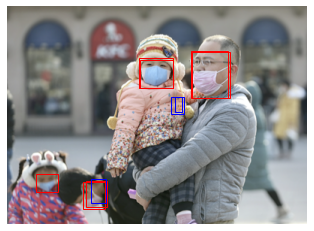

{'boxes': tensor([[175.2010,  68.7076, 221.0753, 107.8532],
        [ 37.6278, 223.6039,  66.9163, 247.6373],
        [246.1381,  60.9530, 296.3051, 121.9060],
        [100.1024, 233.3773, 129.7652, 269.4680],
        [218.3116, 119.7980, 235.7334, 143.3068],
        [244.3381,  59.2045, 294.5429, 121.2975],
        [104.3445, 232.8844, 131.9779, 266.7798],
        [223.0895, 121.0226, 233.0521, 140.6474],
        [177.0165,  71.4719, 220.8344, 108.9414],
        [111.0385, 230.0639, 131.1644, 261.6161]], device='cuda:0'), 'labels': tensor([2, 2, 2, 2, 1, 3, 3, 1, 3, 1], device='cuda:0'), 'scores': tensor([0.9842, 0.9823, 0.8410, 0.8214, 0.4313, 0.4207, 0.2993, 0.2042, 0.0685,
        0.0565], device='cuda:0')}
{'boxes': tensor([[104.7850, 612.4138, 184.7525, 681.3793],
        [250.9325, 689.6552, 361.2325, 744.8276],
        [488.0775, 195.8621, 609.4075, 295.1724],
        [672.8300, 176.5517, 818.9775, 336.5517]], device='cuda:0'), 'labels': tensor([2, 2, 2, 3], device='cuda:0'), '

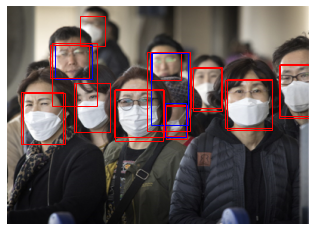

{'boxes': tensor([[ 95.6711,  12.0045, 129.3469,  51.6166],
        [142.3007, 108.3396, 205.5334, 177.4544],
        [ 90.3179, 100.7055, 135.7544, 166.3917],
        [ 62.4080,  50.1612, 112.4004,  96.1228],
        [190.9553,  59.9817, 229.4659,  96.8099],
        [ 19.8878, 114.1337,  75.7492, 181.7507],
        [360.3429,  75.4396, 400.0000, 144.5453],
        [290.5010,  96.0759, 349.6127, 163.0804],
        [245.2900,  79.8233, 283.7517, 137.7142],
        [210.0975, 130.7233, 237.3839, 175.2154],
        [208.9771, 131.2145, 237.7476, 171.3125],
        [287.4874,  97.5897, 350.8474, 161.2159],
        [243.1372,  80.9002, 282.9477, 133.9953],
        [ 88.2878, 100.4662, 135.4599, 166.3840],
        [359.3899,  77.2004, 400.0000, 146.8500],
        [ 17.3701, 112.4413,  73.8767, 181.2959],
        [188.5964,  60.0465, 229.8314,  97.5517],
        [ 56.7273,  50.4755, 107.7723,  94.2374],
        [190.1660,  61.3206, 238.8897, 156.4545],
        [208.2558, 128.0119, 236.0478, 1

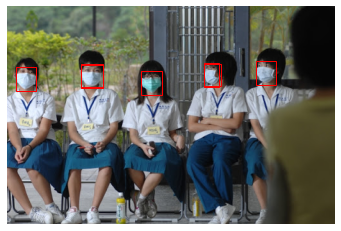

{'boxes': tensor([[388.2643,  84.9125, 419.0976, 122.7498],
        [ 12.5219,  93.6634,  44.8577, 131.9957],
        [307.3868,  88.3292, 331.0132, 125.3279],
        [208.0533, 101.2821, 241.8635, 138.1642],
        [115.2441,  90.3799, 148.6329, 127.7702],
        [307.7490,  89.5307, 333.7646, 124.5570],
        [114.4817,  90.6891, 148.8564, 125.7792]], device='cuda:0'), 'labels': tensor([2, 2, 2, 2, 2, 3, 3], device='cuda:0'), 'scores': tensor([0.9913, 0.9912, 0.9910, 0.9901, 0.9852, 0.1204, 0.0670],
       device='cuda:0')}
{'boxes': tensor([[ 32.9219, 223.5294, 105.8203, 308.2353],
        [272.7812, 218.8235, 345.6797, 296.4706],
        [493.8281, 247.0588, 566.7266, 322.3530],
        [721.9297, 216.4706, 780.7188, 289.4118],
        [912.4062, 204.7059, 982.9531, 284.7059]], device='cuda:0'), 'labels': tensor([2, 2, 2, 2, 2], device='cuda:0'), 'image_id': tensor([788], device='cuda:0')}


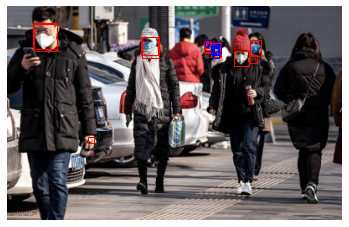

{'boxes': tensor([[270.2531,  52.2901, 288.7528,  70.1775],
        [289.5985,  39.8962, 303.1476,  58.9074],
        [159.8592,  36.2217, 179.6968,  57.2492],
        [ 31.8649,  19.9066,  58.4604,  52.6022],
        [243.5066,  43.3094, 253.7250,  59.6277],
        [236.1263,  40.5282, 240.9540,  48.4747],
        [245.3418,  42.3205, 251.3690,  49.4414],
        [236.2021,  39.8318, 240.6983,  47.2894],
        [242.5404,  45.2195, 254.2517,  60.1019],
        [289.6483,  57.4355, 297.4589,  67.3376],
        [ 96.2211, 155.9916, 103.3877, 163.2357],
        [246.7150,  46.2331, 254.7911,  57.1286],
        [234.8178,  43.0697, 243.5587,  54.7498],
        [244.5599,  42.3947, 252.4314,  53.4941],
        [160.5021,  36.1946, 181.0574,  61.0487],
        [235.1818,  41.5990, 242.4604,  52.1153],
        [243.3490,  43.3389, 255.3069,  60.4956],
        [234.7262,  42.5044, 243.2631,  53.6488],
        [235.8801,  40.5342, 242.3947,  51.3200],
        [236.1094,  40.6861, 241.1847,  

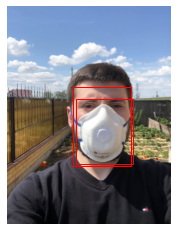

{'boxes': tensor([[121.3311, 148.0791, 226.7815, 293.5807],
        [125.3759, 170.4965, 230.3675, 290.2032]], device='cuda:0'), 'labels': tensor([2, 3], device='cuda:0'), 'scores': tensor([0.9924, 0.1717], device='cuda:0')}
{'boxes': tensor([[329.5681, 422.5425, 600.6645, 765.3600]], device='cuda:0'), 'labels': tensor([2], device='cuda:0'), 'image_id': tensor([790], device='cuda:0')}


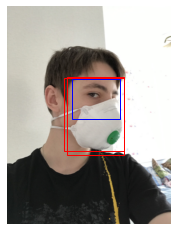

{'boxes': tensor([[109.8387, 129.3367, 214.7444, 273.1080],
        [117.8690, 132.3778, 207.5621, 207.4335],
        [103.2330, 131.2675, 214.3501, 264.8411]], device='cuda:0'), 'labels': tensor([2, 1, 3], device='cuda:0'), 'scores': tensor([0.9827, 0.1065, 0.0925], device='cuda:0')}
{'boxes': tensor([[329.5681, 321.5575, 566.1130, 701.5800]], device='cuda:0'), 'labels': tensor([2], device='cuda:0'), 'image_id': tensor([791], device='cuda:0')}


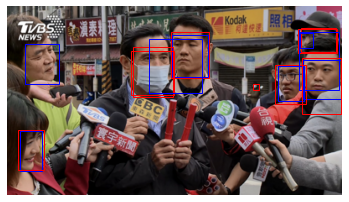

{'boxes': tensor([[ 21.1342,  44.1460,  61.2926,  92.2651],
        [196.4551,  33.1985, 239.5082,  83.4786],
        [ 14.4987, 148.1808,  41.1038, 196.0331],
        [353.2301,  63.0925, 398.4514, 110.4918],
        [322.5695,  70.8200, 354.3105, 113.0198],
        [293.6968,  91.8558, 299.7924,  98.8399],
        [149.5264,  47.6344, 197.5416, 107.4512],
        [147.9678,  52.3156, 199.1092, 105.0584],
        [347.8969,  26.7055, 393.6178,  53.5567],
        [349.9394,  25.0719, 391.8352,  53.8638],
        [347.3243,  26.4456, 394.1172,  55.1305],
        [349.3898,  31.0586, 364.2913,  48.8115],
        [319.7516,  69.9162, 356.4843, 115.5318],
        [348.2703,  29.6208, 396.0331,  99.3763],
        [351.3452,  60.8090, 398.4873, 127.7343],
        [195.4884,  29.5369, 240.7887,  84.8435],
        [168.5340,  38.8587, 232.6840, 103.2489],
        [ 12.8411, 146.7700,  43.0609, 194.9196]], device='cuda:0'), 'labels': tensor([1, 1, 1, 1, 1, 2, 2, 3, 1, 3, 2, 1, 3, 1, 3, 3, 1, 3]

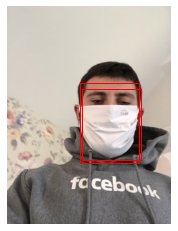

{'boxes': tensor([[133.0054, 140.3813, 241.6972, 287.2696],
        [137.8051, 150.6801, 245.7796, 282.1553]], device='cuda:0'), 'labels': tensor([2, 3], device='cuda:0'), 'scores': tensor([0.9937, 0.0745], device='cuda:0')}
{'boxes': tensor([[356.1462, 390.6525, 640.5316, 730.8125]], device='cuda:0'), 'labels': tensor([2], device='cuda:0'), 'image_id': tensor([793], device='cuda:0')}


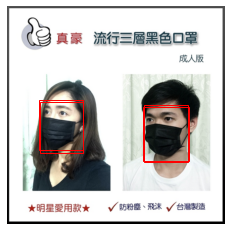

{'boxes': tensor([[250.2019, 184.6020, 333.1125, 283.6923],
        [ 59.2695, 175.6966, 139.4281, 269.5950],
        [ 58.4784, 172.6452, 139.6691, 263.6309],
        [251.3574, 180.7484, 332.9096, 285.3539]], device='cuda:0'), 'labels': tensor([2, 2, 3, 3], device='cuda:0'), 'scores': tensor([0.9853, 0.9630, 0.1625, 0.0863], device='cuda:0')}
{'boxes': tensor([[130., 358., 274., 526.],
        [508., 378., 664., 552.]], device='cuda:0'), 'labels': tensor([2, 2], device='cuda:0'), 'image_id': tensor([794], device='cuda:0')}


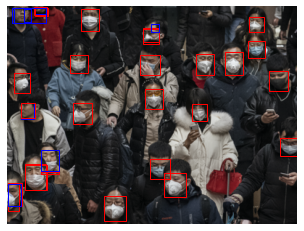

{'boxes': tensor([[  9.0474,  91.3947,  31.6304, 118.6305],
        [254.1156, 134.3173, 274.8540, 158.1833],
        [101.9437,   3.8004, 126.8261,  34.1361],
        [260.4610,  64.6817, 284.4394,  93.9831],
        [216.2795, 229.2315, 245.6609, 262.7083],
        [132.6869, 261.1518, 163.6453, 295.2840],
        [189.1294, 112.9998, 214.2410, 140.8579],
        [196.2006, 209.9020, 223.6501, 237.7669],
        [  9.3161,   1.7914,  32.4015,  22.9845],
        [299.4867,  62.4645, 324.7390,  93.7849],
        [360.1301,  88.8245, 387.2111, 115.6324],
        [182.4747,  66.3815, 209.9933,  94.4476],
        [376.3965, 181.3221, 400.0000, 206.4587],
        [331.5346,  47.4767, 354.9191,  70.2812],
        [ 90.4955, 133.1429, 116.2659, 162.3492],
        [ 86.4900,  66.9083, 110.5530,  91.1626],
        [332.8178,  14.4261, 353.1983,  35.2617],
        [ 18.1912, 132.9146,  36.8467, 155.4541],
        [  0.0000, 243.1591,  16.2852, 281.2923],
        [ 24.6010, 216.8846,  52.7346, 2

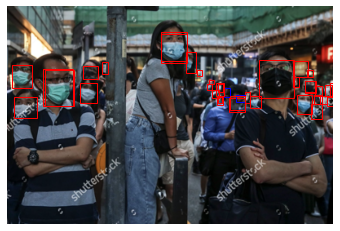

{'boxes': tensor([[308.9823,  64.8308, 351.6795, 112.2930],
        [355.0044, 108.5866, 373.6258, 131.6280],
        [  5.0864,  71.1099,  29.5061,  99.1845],
        [ 88.5751,  93.8408, 109.2781, 118.3871],
        [297.6116, 109.9123, 310.8236, 124.6606],
        [187.9983,  30.5910, 220.2379,  69.1992],
        [389.7059,  96.0621, 398.1009, 109.0031],
        [  7.3128, 110.3137,  35.8964, 136.7062],
        [372.3399, 119.0289, 386.4082, 137.5242],
        [ 43.0406,  76.7718,  80.3270, 122.1494],
        [218.4808,  55.5318, 230.9591,  81.1234],
        [271.3645, 111.6370, 292.0458, 128.7478],
        [364.6686,  90.7426, 378.1315, 106.0701],
        [258.3943,  94.2465, 264.3581, 104.7415],
        [391.8488, 111.3706, 400.0000, 122.0457],
        [350.1694,  66.6795, 368.8824,  86.5858],
        [367.1873,  77.6158, 375.1763,  86.0358],
        [266.2731, 100.1161, 272.5421, 111.3142],
        [ 93.0557,  72.2145, 111.3199,  88.2345],
        [291.4735, 105.2254, 298.0709, 1

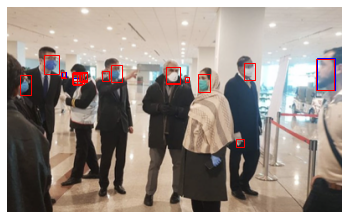

{'boxes': tensor([[227.6329,  80.3908, 241.4927, 101.9524],
        [281.8828,  66.7719, 296.0215,  86.5061],
        [ 43.7840,  57.4120,  61.6954,  79.2975],
        [ 14.4533,  81.2079,  28.4943, 105.4434],
        [123.2775,  68.6958, 137.0770,  89.2545],
        [189.6928,  71.9030, 205.7082,  91.9559],
        [112.8402,  76.4740, 120.7153,  87.6804],
        [211.8937,  83.5449, 216.9231,  89.0696],
        [ 64.0036,  77.1248,  69.4677,  84.2334],
        [ 78.0404,  79.3682,  88.9554,  93.0257],
        [ 78.2043,  77.0418,  84.8572,  84.7671],
        [ 86.8397,  78.1791,  94.4031,  88.3240],
        [369.0740,  60.8557, 391.5222,  99.1036],
        [ 85.9855,  77.8347,  95.1242,  89.5719],
        [272.9520, 157.4369, 282.4452, 167.5673],
        [368.1961,  61.9973, 389.6891,  98.5505],
        [ 78.0163,  77.7380,  86.0168,  87.6926],
        [ 78.1876,  77.7412,  86.1481,  87.8896],
        [ 85.6873,  78.5552,  94.6291,  88.4738],
        [ 64.4804,  77.2165,  69.2201,  

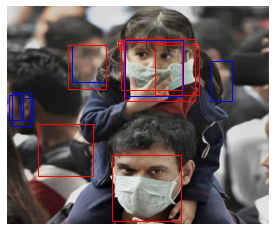

{'boxes': tensor([[159.7449, 226.8366, 266.1927, 328.2894],
        [ 99.0221,  58.3822, 150.5930, 115.2674],
        [178.4399,  49.8141, 287.4265, 143.7669],
        [ 23.3595, 139.7669,  38.0202, 174.4922],
        [168.6264,  52.9015, 177.3093,  64.3462],
        [ 46.0297, 179.3819, 130.3972, 259.5537],
        [173.5275,  54.8001, 267.2755, 127.9677],
        [311.3857,  83.8730, 343.2219, 144.0571],
        [226.1109,  58.7897, 292.8215, 135.6018],
        [  6.4043, 132.4129,  36.5272, 182.3985],
        [ 93.0694,  58.4126, 151.1078, 126.7148],
        [  2.6214, 135.3362,  21.0853, 174.1472],
        [179.3919,  50.3068, 268.4253, 136.0771]], device='cuda:0'), 'labels': tensor([2, 1, 2, 1, 2, 2, 3, 1, 2, 1, 3, 1, 1], device='cuda:0'), 'scores': tensor([0.9944, 0.9752, 0.9340, 0.7197, 0.5524, 0.5340, 0.4609, 0.2201, 0.1262,
        0.1104, 0.0837, 0.0760, 0.0594], device='cuda:0')}
{'boxes': tensor([[444.0000, 148.9489, 652.8000, 312.3123],
        [393.6000, 571.7718, 628.800

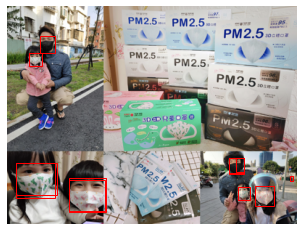

{'boxes': tensor([[317.7578, 248.0539, 334.4291, 266.8875],
        [ 30.1829,  64.3952,  48.0463,  82.0965],
        [341.3084, 247.3174, 367.2312, 274.9192],
        [ 45.3127,  39.8751,  65.9092,  63.8966],
        [ 84.2428, 236.6955, 135.1327, 283.5665],
        [ 11.5529, 215.2359,  65.6345, 264.1993],
        [304.9004, 208.5141, 325.5454, 231.1498],
        [315.5027, 209.1356, 325.7302, 228.5750],
        [305.6713, 209.1874, 325.9701, 229.1610],
        [390.2291, 234.0756, 394.4668, 240.0493],
        [ 85.3578, 238.7442, 134.5296, 281.3141],
        [ 11.9392, 215.0340,  67.6055, 260.2749]], device='cuda:0'), 'labels': tensor([2, 2, 2, 2, 2, 2, 2, 2, 3, 2, 3, 3], device='cuda:0'), 'scores': tensor([0.9962, 0.9917, 0.9888, 0.9882, 0.9811, 0.9801, 0.9528, 0.1139, 0.0758,
        0.0639, 0.0565, 0.0503], device='cuda:0')}
{'boxes': tensor([[ 77.2850, 176.0000, 125.2550, 218.6667],
        [119.9250, 109.3333, 173.2250, 168.0000],
        [ 29.3150, 578.6667, 173.2250, 701.3334

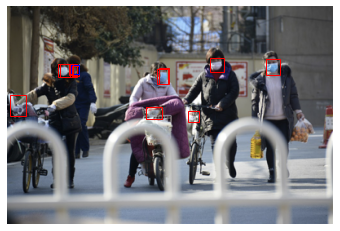

{'boxes': tensor([[248.9479,  63.0690, 265.1021,  80.4121],
        [316.7229,  64.6425, 333.9418,  83.2964],
        [ 61.3018,  69.9707,  76.2294,  86.5810],
        [185.6657,  74.6253, 198.1907,  94.2763],
        [ 78.5651,  72.6983,  87.5438,  84.4309],
        [170.3015, 122.9645, 189.3797, 137.2374],
        [ 75.7700,  71.4541,  85.0135,  84.0771],
        [ 63.9444,  70.7293,  85.1358,  86.6154],
        [  2.6822, 108.5033,  22.2901, 134.1155],
        [221.6933, 128.1130, 234.8417, 141.6168],
        [183.8146,  76.1165, 197.3785,  94.6804],
        [ 78.2492,  72.0481,  87.5605,  82.9490],
        [ 75.1114,  69.9107,  80.2634,  82.6544]], device='cuda:0'), 'labels': tensor([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 1, 2], device='cuda:0'), 'scores': tensor([0.9958, 0.9929, 0.9874, 0.9847, 0.6446, 0.2249, 0.1418, 0.1152, 0.0620,
        0.0611, 0.0564, 0.0536, 0.0503], device='cuda:0')}
{'boxes': tensor([[ 185.6900,  212.7341,  227.6200,  254.6816],
        [ 551.0800,  227.7154,  

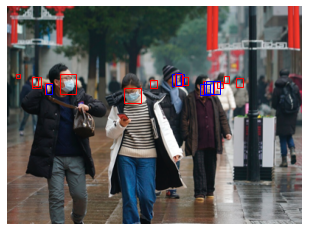

{'boxes': tensor([[ 71.4680,  91.4523,  92.7931, 118.4062],
        [157.9039, 110.5111, 180.6400, 130.8773],
        [ 33.8185,  95.9496,  41.2432, 107.0907],
        [192.7462,  99.3200, 202.0590, 110.3870],
        [266.7183, 100.6405, 278.4517, 118.1500],
        [227.9246,  90.3227, 235.3830, 106.2474],
        [293.5977,  93.4003, 299.9675, 103.6713],
        [309.9474,  96.9710, 318.9794, 108.3157],
        [ 50.7098, 103.7565,  60.7424, 118.5250],
        [222.8809,  91.3540, 239.4927, 107.2585],
        [ 51.8270, 105.1065,  60.6400, 118.0100],
        [284.5124, 101.4717, 291.8696, 110.6863],
        [ 11.3107,  91.5352,  16.2569,  97.1546],
        [264.6031, 100.1738, 280.7020, 119.2081],
        [226.4899,  91.4336, 236.0738, 107.6469],
        [237.9379,  95.7077, 244.3263, 105.8849],
        [261.2096, 104.6706, 273.9746, 119.3278],
        [268.6080, 101.0457, 287.8230, 119.0268],
        [ 33.1473,  95.1217,  45.0881, 109.9391]], device='cuda:0'), 'labels': tensor([2, 

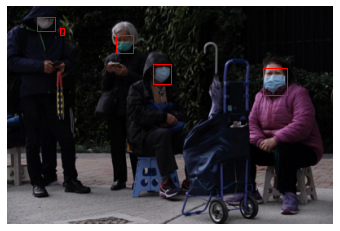

{'boxes': tensor([[313.6505,  74.6639, 343.0149, 107.9882],
        [178.4896,  70.0644, 200.9926,  95.1472],
        [133.0287,  34.9330, 153.9850,  57.3200],
        [ 36.5485,  12.0647,  58.4999,  29.3351],
        [ 63.9488,  25.7782,  69.5472,  34.3087]], device='cuda:0'), 'labels': tensor([2, 2, 2, 2, 2], device='cuda:0'), 'scores': tensor([0.9958, 0.9909, 0.9881, 0.9277, 0.1701], device='cuda:0')}
{'boxes': tensor([[ 107.8200,   26.9663,  179.7000,   86.8914],
        [ 398.3350,  104.8689,  458.2350,  167.7903],
        [ 539.1000,  212.7341,  604.9900,  281.6479],
        [ 934.4399,  227.7154, 1030.2799,  326.5918]], device='cuda:0'), 'labels': tensor([2, 2, 2, 2], device='cuda:0'), 'image_id': tensor([802], device='cuda:0')}


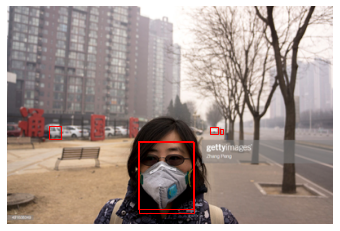

{'boxes': tensor([[161.2399, 166.4287, 228.5681, 253.1936],
        [249.0935, 148.1709, 258.9383, 156.4440],
        [ 50.6083, 145.9207,  65.6482, 162.3660],
        [260.4532, 150.1476, 264.0963, 156.1238],
        [159.8803, 164.7896, 228.0994, 247.9297]], device='cuda:0'), 'labels': tensor([2, 2, 2, 2, 3], device='cuda:0'), 'scores': tensor([0.9952, 0.4289, 0.2258, 0.0898, 0.0515], device='cuda:0')}
{'boxes': tensor([[482.1950, 509.3633, 679.8650, 743.0712]], device='cuda:0'), 'labels': tensor([2], device='cuda:0'), 'image_id': tensor([803], device='cuda:0')}


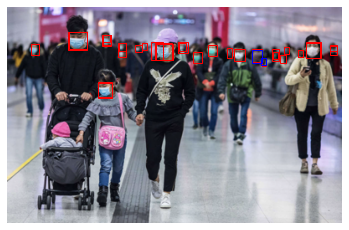

{'boxes': tensor([[356.3059,  42.2532, 373.4496,  60.7263],
        [ 27.8563,  44.4309,  37.7523,  56.9789],
        [270.3949,  49.9131, 283.7217,  63.8473],
        [107.9963,  89.2447, 125.2901, 108.5091],
        [221.4063,  53.5605, 232.2294,  66.0827],
        [238.8593,  45.3015, 250.4745,  57.9037],
        [176.3066,  42.6504, 196.4896,  63.2492],
        [132.6967,  43.1237, 140.9182,  52.3129],
        [112.9067,  32.9740, 123.2822,  46.1080],
        [ 72.6719,  29.5570,  94.4813,  51.4006],
        [384.9735,  46.5782, 393.8419,  56.6663],
        [317.0840,  53.1056, 323.2582,  62.1193],
        [205.0256,  42.7581, 213.4265,  52.3792],
        [152.7568,  45.3404, 160.5404,  53.7616],
        [292.3973,  50.1171, 304.2142,  65.6404],
        [261.7901,  49.1647, 268.6237,  60.7179],
        [347.1882,  50.5189, 352.9158,  58.9645],
        [325.8150,  57.1853, 332.9872,  66.5851],
        [160.1713,  43.0174, 166.0451,  51.2811],
        [ 73.5344,  28.9789,  94.7868,  

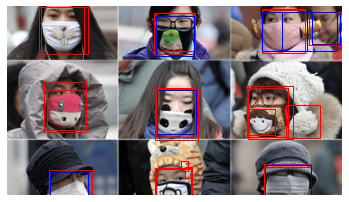

{'boxes': tensor([[3.6363e+02, 6.0790e+00, 3.9722e+02, 4.3758e+01],
        [4.3459e+01, 8.9621e+01, 9.3380e+01, 1.4942e+02],
        [3.9753e+01, 1.0563e-01, 9.0712e+01, 5.6325e+01],
        [2.8721e+02, 9.4323e+01, 3.4073e+02, 1.5805e+02],
        [1.7727e+02, 1.9327e+02, 2.2085e+02, 2.2500e+02],
        [3.0444e+02, 3.8773e+00, 3.5569e+02, 5.5410e+01],
        [1.7518e+02, 7.0260e+00, 2.2361e+02, 5.6739e+01],
        [1.7634e+02, 9.8669e+01, 2.2742e+02, 1.5924e+02],
        [2.8806e+02, 1.2238e+02, 3.1932e+02, 1.5308e+02],
        [3.0646e+02, 1.8760e+02, 3.6194e+02, 2.2500e+02],
        [1.7774e+02, 9.7157e+01, 2.2435e+02, 1.5532e+02],
        [1.7669e+02, 7.3307e+00, 2.2299e+02, 5.3034e+01],
        [3.0748e+02, 1.9108e+02, 3.6274e+02, 2.2500e+02],
        [4.9928e+01, 1.9505e+02, 1.0093e+02, 2.2500e+02],
        [3.0387e+02, 2.4953e+00, 3.5517e+02, 5.2975e+01],
        [3.7488e+01, 7.6553e-02, 9.5465e+01, 5.6116e+01],
        [2.8586e+02, 9.7040e+01, 3.3548e+02, 1.5569e+02],
    

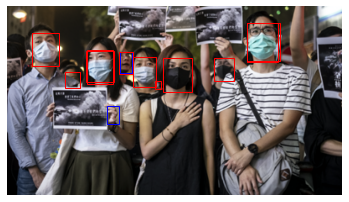

{'boxes': tensor([[186.1827,  60.9164, 220.7005, 101.2874],
        [149.5557,  59.9711, 177.8582,  95.9700],
        [ 28.5476,  31.4261,  61.6502,  71.0406],
        [ 94.3863,  51.3192, 125.8636,  91.5636],
        [286.1400,  19.2752, 323.3136,  65.2831],
        [134.3326,  54.2145, 148.9448,  79.3891],
        [247.0874,  61.5164, 270.7029,  88.4956],
        [ 68.2458,  78.3448,  86.9527,  96.5755],
        [285.7085,  19.7177, 325.0311,  65.1917],
        [119.1752, 117.9049, 132.5964, 140.0768],
        [176.2354,  88.2549, 183.7620,  97.7264],
        [133.2738,  53.3855, 149.9077,  80.5075],
        [ 93.8204,  52.5061, 127.6687,  89.2149]], device='cuda:0'), 'labels': tensor([2, 2, 2, 2, 2, 1, 2, 2, 3, 1, 2, 3, 3], device='cuda:0'), 'scores': tensor([0.9965, 0.9942, 0.9932, 0.9866, 0.9810, 0.9775, 0.9285, 0.8495, 0.0925,
        0.0909, 0.0748, 0.0717, 0.0555], device='cuda:0')}
{'boxes': tensor([[  96.6425,  113.1822,  206.6150,  226.3644],
        [ 316.5875,  176.4311,  

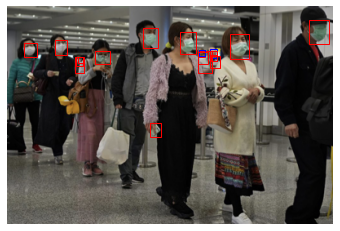

{'boxes': tensor([[ 19.7288,  44.6561,  35.7230,  61.9247],
        [ 58.0255,  40.6797,  73.4778,  59.1128],
        [370.3474,  16.2355, 394.2529,  45.4253],
        [212.0398,  30.8370, 231.1068,  58.4917],
        [166.5755,  26.3639, 184.2900,  50.9194],
        [107.7834,  54.6451, 125.1315,  70.7517],
        [272.6922,  33.3510, 296.2827,  64.2951],
        [ 84.0115,  61.2786,  92.8540,  72.7913],
        [248.8750,  52.4082, 256.9772,  63.0122],
        [233.3575,  54.1890, 250.3656,  80.9813],
        [248.7002,  60.5421, 260.3329,  75.0909],
        [175.1325, 142.7577, 188.9651, 160.2502],
        [249.6505,  60.1634, 257.6532,  66.9560],
        [ 82.2608,  61.2945,  93.7985,  81.8028],
        [234.8493,  53.6462, 242.8940,  61.1424],
        [ 86.0083,  61.7075,  92.5659,  69.1093],
        [234.8855,  53.4354, 242.7065,  61.0567],
        [248.6294,  58.9213, 257.5365,  66.0164],
        [249.0350,  59.7847, 257.3126,  66.9296],
        [234.2337,  56.1299, 245.6677,  

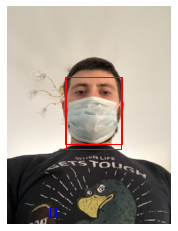

{'boxes': tensor([[107.0221, 129.7683, 208.2812, 261.8390],
        [ 77.4528, 368.8545,  89.5591, 387.3990],
        [105.2798, 129.7020, 210.2000, 251.9444]], device='cuda:0'), 'labels': tensor([2, 1, 3], device='cuda:0'), 'scores': tensor([0.9890, 0.1720, 0.1022], device='cuda:0')}
{'boxes': tensor([[289.7010, 356.1050, 547.5083, 672.3475]], device='cuda:0'), 'labels': tensor([2], device='cuda:0'), 'image_id': tensor([808], device='cuda:0')}


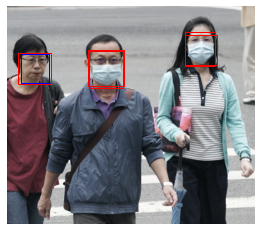

{'boxes': tensor([[288.0696,  40.9925, 335.1982,  96.8067],
        [ 22.2742,  76.4546,  66.4849, 123.1997],
        [132.7099,  71.1084, 186.7318, 132.3339],
        [131.0192,  70.1517, 188.9693, 128.2449],
        [ 16.2052,  74.9804,  70.4896, 124.4785],
        [287.7990,  45.6949, 338.4134,  93.9848]], device='cuda:0'), 'labels': tensor([2, 1, 2, 3, 3, 3], device='cuda:0'), 'scores': tensor([0.9933, 0.9821, 0.9569, 0.1771, 0.0882, 0.0570], device='cuda:0')}
{'boxes': tensor([[ 47.7225, 177.2727, 147.7125, 270.4545],
        [304.5150, 175.0000, 427.2300, 290.9091],
        [659.0250,  97.7273, 761.2875, 211.3636]], device='cuda:0'), 'labels': tensor([1, 2, 2], device='cuda:0'), 'image_id': tensor([809], device='cuda:0')}


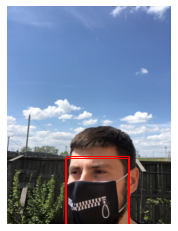

{'boxes': tensor([[106.3027, 277.6410, 221.8142, 400.0000],
        [106.9344, 274.8586, 223.8464, 400.0000]], device='cuda:0'), 'labels': tensor([2, 3], device='cuda:0'), 'scores': tensor([0.9829, 0.0634], device='cuda:0')}
{'boxes': tensor([[ 284.3854,  736.1275,  574.0864, 1063.0000]], device='cuda:0'), 'labels': tensor([2], device='cuda:0'), 'image_id': tensor([810], device='cuda:0')}


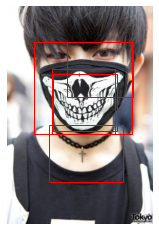

{'boxes': tensor([[ 49.0901,  64.3816, 229.8686, 233.5155],
        [ 77.0698, 217.7260, 212.9068, 323.1588],
        [ 82.7631, 114.3053, 197.3400, 234.1975],
        [109.7793,  64.8302, 231.0849, 166.9857],
        [ 84.1199, 123.8133, 200.6945, 228.7100]], device='cuda:0'), 'labels': tensor([2, 2, 2, 2, 3], device='cuda:0'), 'scores': tensor([0.9950, 0.7083, 0.4729, 0.1619, 0.0924], device='cuda:0')}
{'boxes': tensor([[167.7903, 140.7650, 668.1648, 712.8100]], device='cuda:0'), 'labels': tensor([2], device='cuda:0'), 'image_id': tensor([811], device='cuda:0')}


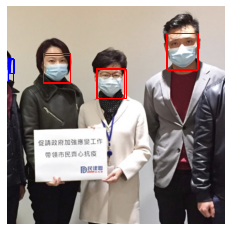

{'boxes': tensor([[163.0813, 112.0287, 214.6073, 168.6824],
        [ 66.1540,  85.4567, 114.3796, 140.3135],
        [294.0494,  48.7972, 349.4915, 116.6526],
        [  1.0969,  93.6365,   9.2881, 137.5387],
        [  0.6697,  95.3272,   4.8976, 120.4660],
        [292.4367,  48.5557, 351.3298, 114.7213],
        [ 65.7470,  88.5382, 114.5036, 138.2421],
        [164.0629, 114.8126, 218.7744, 167.2346],
        [  2.0039,  96.1850,  11.3201, 123.0006]], device='cuda:0'), 'labels': tensor([2, 2, 2, 1, 1, 3, 3, 3, 1], device='cuda:0'), 'scores': tensor([0.9945, 0.9802, 0.9733, 0.2019, 0.1410, 0.1105, 0.0870, 0.0614, 0.0503],
       device='cuda:0')}
{'boxes': tensor([[582., 108., 704., 226.],
        [330., 230., 426., 330.],
        [132., 182., 230., 272.]], device='cuda:0'), 'labels': tensor([2, 2, 2], device='cuda:0'), 'image_id': tensor([812], device='cuda:0')}


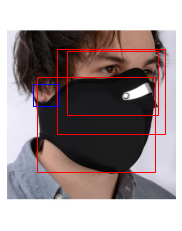

{'boxes': tensor([[111.9286,  96.5499, 355.7454, 287.4095],
        [ 57.5149, 174.9225, 115.7672, 224.3017],
        [ 66.7678, 159.7844, 334.5468, 374.9476],
        [135.6005, 100.4660, 341.3795, 244.3945]], device='cuda:0'), 'labels': tensor([2, 1, 2, 3], device='cuda:0'), 'scores': tensor([0.9556, 0.5113, 0.1630, 0.1058], device='cuda:0')}
{'boxes': tensor([[207.8740, 209.9593, 713.9108, 802.0447]], device='cuda:0'), 'labels': tensor([2], device='cuda:0'), 'image_id': tensor([813], device='cuda:0')}


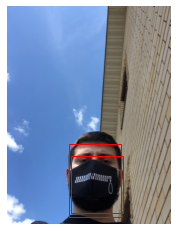

{'boxes': tensor([[113.0008, 252.8312, 208.7027, 387.4982],
        [300.9960,  24.3643, 301.0000,  30.3747],
        [300.9961,  24.3976, 301.0000,  30.3289],
        [300.9960,  24.3840, 301.0000,  30.3591],
        [300.8696, 330.9385, 300.9985, 337.7141],
        [300.8700, 330.9872, 300.9975, 337.6895],
        [300.8708, 330.9935, 300.9976, 337.7048],
        [116.2882, 274.0254, 213.0914, 380.4766]], device='cuda:0'), 'labels': tensor([2, 2, 1, 3, 2, 3, 1, 3], device='cuda:0'), 'scores': tensor([0.9971, 0.2054, 0.1814, 0.1740, 0.1042, 0.0866, 0.0763, 0.0635],
       device='cuda:0')}
{'boxes': tensor([[ 302.9901,  696.2650,  550.1661, 1007.1925]], device='cuda:0'), 'labels': tensor([2], device='cuda:0'), 'image_id': tensor([814], device='cuda:0')}


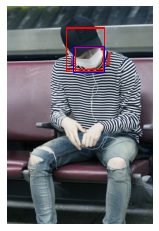

{'boxes': tensor([[120.5500,  73.7635, 176.3783, 118.8092],
        [123.5084,  75.0203, 175.5890, 119.4595],
        [107.1811,  39.7976, 178.4073, 114.6819],
        [108.1239,  38.0955, 176.9626, 117.7109],
        [120.1130,  73.3270, 178.2768, 120.4361]], device='cuda:0'), 'labels': tensor([3, 2, 3, 2, 1], device='cuda:0'), 'scores': tensor([0.6798, 0.4507, 0.3430, 0.1496, 0.0856], device='cuda:0')}
{'boxes': tensor([[350.5618, 230.6150, 536.3296, 350.4150]], device='cuda:0'), 'labels': tensor([3], device='cuda:0'), 'image_id': tensor([815], device='cuda:0')}


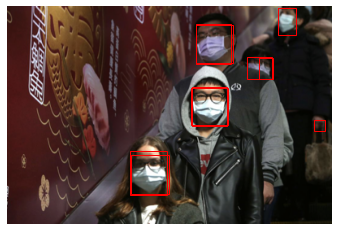

{'boxes': tensor([[333.6627,   2.0093, 356.0223,  35.0049],
        [231.8031,  20.9895, 274.9551,  70.9194],
        [151.1483, 178.2885, 196.3267, 232.2006],
        [226.7797,  98.8906, 270.5257, 147.3980],
        [294.4517,  61.8251, 326.4518,  88.4784],
        [151.9678, 182.8081, 198.9445, 231.1185],
        [232.6107,  23.0631, 278.0201,  69.4676],
        [377.3846, 139.8295, 390.9284, 152.5583],
        [226.1808, 100.2004, 271.0480, 145.8380],
        [310.2160,  62.5807, 327.4355,  89.0278]], device='cuda:0'), 'labels': tensor([2, 2, 2, 2, 2, 3, 3, 2, 3, 2], device='cuda:0'), 'scores': tensor([0.9956, 0.9901, 0.9851, 0.9845, 0.9838, 0.0834, 0.0733, 0.0685, 0.0671,
        0.0521], device='cuda:0')}
{'boxes': tensor([[ 999.9750,   11.9403, 1071.6150,   98.5075],
        [ 877.5900,  182.0895,  973.1100,  253.7313],
        [ 695.5050,   71.6418,  832.8149,  208.9552],
        [ 677.5950,  301.4925,  805.9500,  426.8657],
        [ 453.7200,  549.2537,  585.0600,  686.5671]]

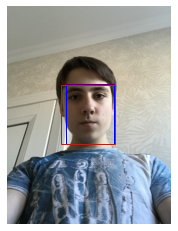

{'boxes': tensor([[107.0819, 142.7177, 196.6861, 252.7854],
        [ 99.2908, 143.9263, 197.3523, 253.2467]], device='cuda:0'), 'labels': tensor([1, 3], device='cuda:0'), 'scores': tensor([0.9799, 0.1461], device='cuda:0')}
{'boxes': tensor([[271.0963, 374.7075, 512.9568, 664.3750]], device='cuda:0'), 'labels': tensor([1], device='cuda:0'), 'image_id': tensor([817], device='cuda:0')}


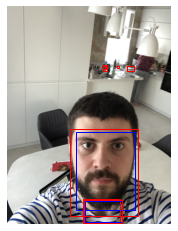

{'boxes': tensor([[126.3424, 230.9148, 234.4659, 374.1756],
        [175.6934, 107.9483, 182.4812, 117.9915],
        [201.3620, 108.4916, 205.6731, 113.3512],
        [138.7155, 354.1156, 207.6539, 399.1550],
        [143.4621, 357.2345, 209.8934, 396.4724],
        [176.1466, 108.3332, 181.5283, 114.6390],
        [140.5980, 355.1479, 209.7798, 398.1674],
        [219.4011, 109.1906, 231.8614, 118.4611],
        [115.2112, 225.0835, 239.5476, 385.2648]], device='cuda:0'), 'labels': tensor([1, 2, 2, 3, 1, 2, 2, 2, 3], device='cuda:0'), 'scores': tensor([0.9791, 0.4315, 0.2322, 0.2263, 0.2203, 0.1737, 0.1201, 0.0944, 0.0647],
       device='cuda:0')}
{'boxes': tensor([[324.2525, 600.5950, 619.2691, 993.9050]], device='cuda:0'), 'labels': tensor([1], device='cuda:0'), 'image_id': tensor([818], device='cuda:0')}


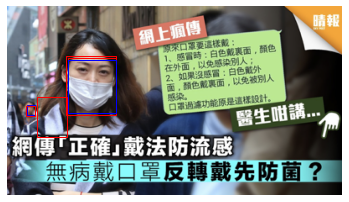

{'boxes': tensor([[ 22.6950, 117.3629,  32.6366, 129.2153],
        [ 72.0782,  61.4968, 129.2744, 127.2172],
        [ 35.5377, 107.9505,  70.5490, 155.6508],
        [ 69.2918,  59.2535, 129.6225, 128.6168],
        [ 72.6006,  63.3078, 130.0743, 126.3364],
        [ 21.6359, 118.0473,  32.6180, 130.2605]], device='cuda:0'), 'labels': tensor([1, 2, 2, 3, 1, 3], device='cuda:0'), 'scores': tensor([0.9742, 0.8829, 0.7543, 0.4979, 0.0817, 0.0803], device='cuda:0')}
{'boxes': tensor([[226.6100, 209.7200, 429.8925, 426.0978]], device='cuda:0'), 'labels': tensor([2], device='cuda:0'), 'image_id': tensor([819], device='cuda:0')}


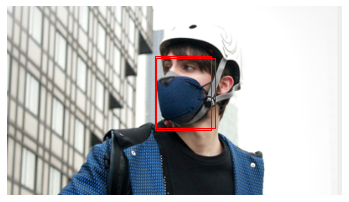

{'boxes': tensor([[175.7893,  58.4990, 242.3941, 146.9524],
        [176.9847,  60.7334, 248.2035, 144.7111]], device='cuda:0'), 'labels': tensor([2, 3], device='cuda:0'), 'scores': tensor([0.9641, 0.1263], device='cuda:0')}
{'boxes': tensor([[593.1850, 193.0756, 823.1275, 472.7022]], device='cuda:0'), 'labels': tensor([2], device='cuda:0'), 'image_id': tensor([820], device='cuda:0')}


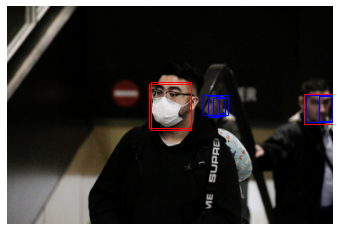

{'boxes': tensor([[366.6775, 108.8731, 398.6014, 141.6587],
        [175.9569,  92.9386, 225.7971, 151.5574],
        [258.9982, 110.7619, 266.9970, 129.9517],
        [245.5849, 109.0042, 259.3373, 134.9735],
        [173.4404,  94.6153, 225.2835, 148.5067],
        [252.6533, 111.5616, 267.5002, 134.1736],
        [239.3198, 107.8090, 270.1322, 132.6146],
        [381.8628, 109.6626, 398.4485, 140.2791],
        [363.3470, 106.9249, 400.0000, 143.8305]], device='cuda:0'), 'labels': tensor([1, 2, 1, 1, 3, 1, 1, 1, 3], device='cuda:0'), 'scores': tensor([0.9808, 0.9422, 0.9313, 0.8838, 0.2496, 0.2147, 0.1227, 0.0808, 0.0647],
       device='cuda:0')}
{'boxes': tensor([[ 527.1200,  281.6479,  670.8800,  446.4420],
        [1111.1449,  323.5955, 1198.0000,  431.4607]], device='cuda:0'), 'labels': tensor([2, 1], device='cuda:0'), 'image_id': tensor([821], device='cuda:0')}


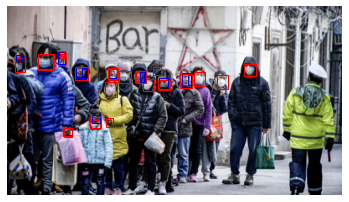

{'boxes': tensor([[161.1874,  85.6072, 174.5349, 100.6414],
        [132.7444,  76.7361, 147.1178,  90.9363],
        [282.6880,  68.7450, 296.4157,  82.9712],
        [  9.0501,  61.0444,  20.5205,  78.3181],
        [222.7015,  77.4231, 236.2076,  94.9115],
        [250.1522,  81.8780, 263.0024,  98.0158],
        [116.0181,  89.4511, 130.5344, 107.6310],
        [ 36.3740,  55.8564,  53.8051,  74.8934],
        [208.6999,  79.3226, 219.1127,  95.4911],
        [ 81.8982,  71.6120,  95.6605,  85.5469],
        [153.2140,  77.5840, 163.2011,  90.1772],
        [ 61.1308,  56.7193,  69.3572,  69.5488],
        [179.9195,  87.1394, 193.5669,  98.8198],
        [120.6469,  74.2919, 131.1896,  85.0752],
        [ 88.5162,  72.5145,  95.2128,  84.8416],
        [ 67.2501, 144.1182,  76.4974, 153.6480],
        [ 98.3634, 135.4691, 110.6084, 146.1214],
        [180.6188,  86.7482, 193.1517,  97.6238],
        [100.6801, 128.7756, 110.7403, 138.9496],
        [ 10.2841,  56.9829,  17.7391,  

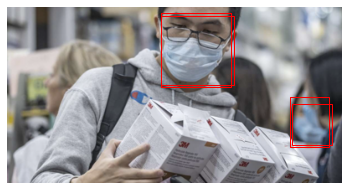

{'boxes': tensor([[183.4526,   6.0506, 266.5741,  95.4511],
        [337.7863, 107.2073, 384.5291, 166.9571],
        [339.3260, 115.3684, 387.4818, 164.4351],
        [183.6672,  10.3120, 270.2146,  93.1952]], device='cuda:0'), 'labels': tensor([2, 2, 3, 3], device='cuda:0'), 'scores': tensor([0.9788, 0.9533, 0.1381, 0.1153], device='cuda:0')}
{'boxes': tensor([[ 609.8475,   16.6429,  886.4450,  306.2286],
        [1136.3824,  379.4571, 1269.6825,  545.8857],
        [1176.3724,  286.2571, 1263.0175,  489.3000],
        [ 139.9650,  236.3286,  233.2750,  442.7000]], device='cuda:0'), 'labels': tensor([2, 2, 2, 1], device='cuda:0'), 'image_id': tensor([823], device='cuda:0')}


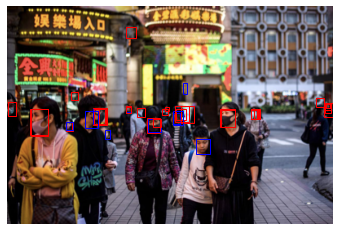

{'boxes': tensor([[1.1332e-01, 1.1745e+02, 1.0734e+01, 1.3448e+02],
        [2.3096e+02, 1.6250e+02, 2.4803e+02, 1.8123e+02],
        [2.9906e+02, 1.2597e+02, 3.0803e+02, 1.3767e+02],
        [2.6140e+02, 1.2495e+02, 2.7871e+02, 1.4787e+02],
        [2.8934e+01, 1.2562e+02, 4.9416e+01, 1.5918e+02],
        [1.0537e+02, 1.2470e+02, 1.2248e+02, 1.4523e+02],
        [1.5917e+02, 1.2407e+02, 1.6861e+02, 1.3485e+02],
        [7.1659e+01, 1.4107e+02, 8.0297e+01, 1.5212e+02],
        [1.4492e+02, 1.2170e+02, 1.5171e+02, 1.2934e+02],
        [2.0299e+02, 1.3085e+02, 2.1153e+02, 1.4389e+02],
        [1.7210e+02, 1.3790e+02, 1.8758e+02, 1.5363e+02],
        [1.1195e+02, 1.2397e+02, 1.2055e+02, 1.4534e+02],
        [3.8984e+02, 1.1924e+02, 3.9668e+02, 1.2653e+02],
        [7.8004e+01, 1.0463e+02, 8.6124e+01, 1.1396e+02],
        [1.0512e+02, 1.2590e+02, 1.2008e+02, 1.4449e+02],
        [2.0695e+02, 1.2597e+02, 2.1901e+02, 1.3906e+02],
        [1.7154e+02, 1.3705e+02, 1.8763e+02, 1.5467e+02],
    

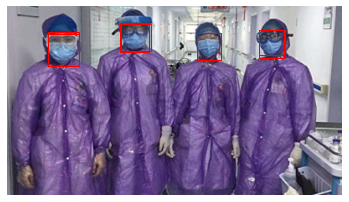

{'boxes': tensor([[225.7742,  31.5693, 254.5188,  62.9109],
        [ 47.9406,  29.4714,  85.5758,  70.8900],
        [134.5953,  19.4236, 169.2806,  53.8896],
        [300.5645,  27.2234, 330.4341,  60.6785],
        [299.9048,  28.0430, 331.7739,  58.0229],
        [ 48.2971,  32.3766,  85.6601,  70.8124],
        [134.9642,  20.5121, 170.9388,  53.1371]], device='cuda:0'), 'labels': tensor([2, 2, 2, 2, 3, 3, 3], device='cuda:0'), 'scores': tensor([0.9945, 0.9709, 0.9676, 0.9495, 0.1927, 0.1425, 0.1292],
       device='cuda:0')}
{'boxes': tensor([[ 149.9625,  109.8533,  283.2625,  226.3644],
        [ 449.8875,   66.5778,  563.1925,  173.1022],
        [ 756.4775,  106.5244,  846.4550,  203.0622],
        [ 999.7500,   99.8667, 1099.7250,  193.0756]], device='cuda:0'), 'labels': tensor([2, 2, 2, 2], device='cuda:0'), 'image_id': tensor([825], device='cuda:0')}


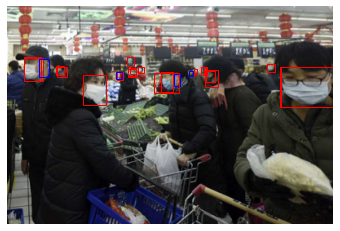

{'boxes': tensor([[188.8681,  80.1541, 203.6729, 104.5699],
        [ 92.3483,  83.6177, 121.3834, 121.1276],
        [ 19.6843,  62.1628,  40.7508,  91.1604],
        [319.0427,  70.1091, 328.4016,  80.6380],
        [147.6911,  76.4659, 157.7737,  86.6954],
        [159.6904,  74.3389, 167.2711,  81.5120],
        [336.1252,  74.1369, 399.6090, 123.4522],
        [242.6523,  78.1242, 258.0803,  98.9272],
        [133.9462,  80.2015, 141.2969,  89.4953],
        [ 58.9444,  73.0199,  68.8760,  84.0614],
        [ 60.8409,  74.2052,  72.4796,  86.1493],
        [237.3210,  74.1279, 243.9712,  83.5866],
        [333.9822,  73.6799, 399.9554, 123.2579],
        [223.1455,  78.8816, 228.3630,  85.0764],
        [138.2267,  79.9517, 141.9002,  88.7163],
        [204.5993,  83.0097, 211.1087,  97.6526],
        [243.6374,  78.4275, 254.5467,  92.5027],
        [240.6370,  74.0025, 244.5175,  84.0954],
        [150.5705,  75.3913, 157.1765,  82.9856],
        [ 19.8048,  62.5702,  42.9062,  

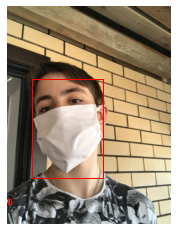

{'boxes': tensor([[ 45.9442, 133.1473, 175.0143, 314.3919],
        [  0.8218, 353.4552,   6.3046, 362.2521]], device='cuda:0'), 'labels': tensor([2, 2], device='cuda:0'), 'scores': tensor([0.9974, 0.0665], device='cuda:0')}
{'boxes': tensor([[127.5748, 382.6800, 470.4319, 815.8525]], device='cuda:0'), 'labels': tensor([2], device='cuda:0'), 'image_id': tensor([827], device='cuda:0')}


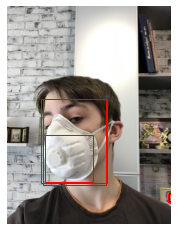

{'boxes': tensor([[ 64.6449, 169.0949, 180.7226, 328.7483],
        [294.8568, 344.7956, 301.0000, 359.1298],
        [ 69.7539, 236.8003, 157.1538, 321.6891],
        [ 61.4769, 170.0836, 183.3412, 323.6728],
        [294.9926, 345.2096, 301.0000, 360.0916],
        [297.2645, 342.5001, 301.0000, 357.4122]], device='cuda:0'), 'labels': tensor([2, 1, 2, 3, 3, 1], device='cuda:0'), 'scores': tensor([0.9698, 0.9045, 0.2482, 0.1683, 0.1073, 0.0523], device='cuda:0')}
{'boxes': tensor([[172.7575, 462.4050, 478.4053, 858.3725]], device='cuda:0'), 'labels': tensor([2], device='cuda:0'), 'image_id': tensor([828], device='cuda:0')}


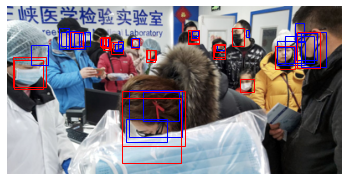

{'boxes': tensor([[277.2838,  85.9892, 294.4670, 101.7715],
        [268.2025,  25.2107, 282.2355,  47.0953],
        [ 75.3933,  30.3448,  88.0918,  47.1127],
        [321.7126,  47.8064, 341.6987,  67.6611],
        [244.9650,  45.3720, 260.2685,  62.5753],
        [125.3777,  41.9527, 137.7027,  51.9195],
        [148.6364,  38.1270, 157.2865,  49.7503],
        [  8.1845,  63.7493,  42.7971,  97.8980],
        [215.6564,  27.6581, 228.1870,  43.8653],
        [344.3844,  30.7639, 370.1464,  63.7930],
        [110.5237,  37.2953, 116.3068,  45.7170],
        [165.8310,  51.1304, 176.1906,  61.9814],
        [114.1288,  35.9323, 122.1669,  51.1386],
        [  6.2862,  60.0946,  46.0850,  95.7757],
        [250.7062,  44.7391, 259.8831,  51.6722],
        [165.5412,  51.3428, 176.6406,  65.6074],
        [161.2183, 102.2344, 204.1879, 136.6332],
        [284.8621,  27.5625, 288.9839,  36.0555],
        [125.7922,  44.4132, 136.9163,  53.2036],
        [124.0582,  42.0944, 138.4048,  

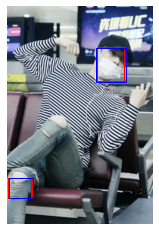

{'boxes': tensor([[1.6371e+02, 7.5320e+01, 2.1715e+02, 1.3684e+02],
        [1.6551e+02, 7.3531e+01, 2.1370e+02, 1.3916e+02],
        [2.5427e-01, 3.1495e+02, 4.4440e+01, 3.5292e+02],
        [1.6309e+02, 7.6663e+01, 2.1799e+02, 1.3840e+02],
        [6.9541e-01, 3.1466e+02, 4.3478e+01, 3.5162e+02],
        [2.3233e+00, 3.1546e+02, 4.6428e+01, 3.5292e+02]], device='cuda:0'), 'labels': tensor([3, 2, 2, 1, 3, 1], device='cuda:0'), 'scores': tensor([0.6877, 0.5179, 0.1944, 0.1260, 0.1036, 0.0622], device='cuda:0')}
{'boxes': tensor([[500.3745, 230.6150, 659.1760, 398.3350]], device='cuda:0'), 'labels': tensor([3], device='cuda:0'), 'image_id': tensor([830], device='cuda:0')}


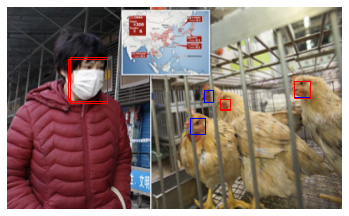

{'boxes': tensor([[ 74.4359,  59.5329, 118.5240, 113.6812],
        [342.1782,  88.0230, 361.6028, 106.7732],
        [217.6671, 132.3898, 236.3753, 151.3291],
        [234.7643,  98.1339, 244.9592, 112.3636],
        [ 72.4136,  61.2825, 118.7240, 111.5821],
        [341.7293,  88.1602, 361.7185, 107.7173],
        [253.8707, 108.8945, 265.1522, 122.4071],
        [253.6801, 108.9943, 265.1621, 121.8387]], device='cuda:0'), 'labels': tensor([2, 1, 1, 1, 3, 3, 2, 3], device='cuda:0'), 'scores': tensor([0.9902, 0.4125, 0.1936, 0.1083, 0.1080, 0.0955, 0.0860, 0.0739],
       device='cuda:0')}
{'boxes': tensor([[245.4950, 205.8091, 398.1000, 371.7842]], device='cuda:0'), 'labels': tensor([2], device='cuda:0'), 'image_id': tensor([831], device='cuda:0')}


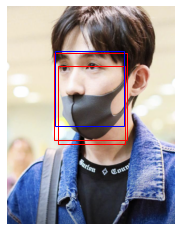

{'boxes': tensor([[ 93.6401, 108.9240, 216.8261, 252.5927],
        [ 85.4561,  84.7294, 219.0413, 246.0039],
        [ 87.0989,  81.6249, 214.0064, 219.9870]], device='cuda:0'), 'labels': tensor([2, 3, 1], device='cuda:0'), 'scores': tensor([0.9277, 0.5494, 0.4281], device='cuda:0')}
{'boxes': tensor([[233.0097, 207.0000, 548.8673, 639.1125]], device='cuda:0'), 'labels': tensor([3], device='cuda:0'), 'image_id': tensor([832], device='cuda:0')}


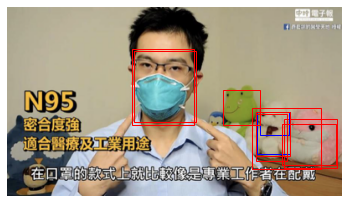

{'boxes': tensor([[149.0181,  49.7967, 222.4034, 140.6570],
        [330.4441, 133.8799, 393.3093, 192.1823],
        [301.4881, 124.8142, 336.2679, 152.3345],
        [298.0143, 125.0427, 336.7879, 175.7458],
        [256.8933,  98.9220, 301.4111, 140.5325],
        [296.9341, 125.6607, 337.7578, 178.0770],
        [296.8663, 127.2295, 333.2047, 183.9360],
        [328.0284, 139.1313, 392.5492, 188.9242],
        [151.1709,  53.0602, 224.4977, 137.7141],
        [291.5068, 120.5604, 374.8328, 193.0733]], device='cuda:0'), 'labels': tensor([2, 2, 1, 1, 2, 3, 2, 3, 3, 2], device='cuda:0'), 'scores': tensor([0.9869, 0.9326, 0.7619, 0.3488, 0.3478, 0.2199, 0.1988, 0.1149, 0.0762,
        0.0671], device='cuda:0')}
{'boxes': tensor([[499.8750, 186.5841, 743.1475, 453.1328]], device='cuda:0'), 'labels': tensor([2], device='cuda:0'), 'image_id': tensor([833], device='cuda:0')}


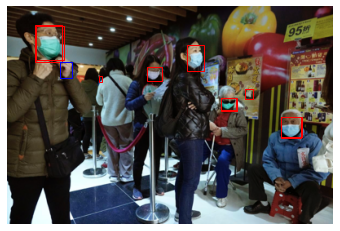

{'boxes': tensor([[220.8269,  47.0085, 241.2450,  78.8140],
        [ 34.0718,  22.5218,  66.9376,  67.2858],
        [262.3867, 112.1221, 281.2442, 127.8828],
        [170.8757,  73.8610, 189.2548,  91.3979],
        [335.8028, 135.4214, 360.7018, 161.4187],
        [291.5982, 101.1290, 301.4336, 113.5392],
        [ 63.9021,  68.0975,  79.6587,  87.7224],
        [ 34.5378,  23.9387,  68.9291,  65.4945],
        [335.8759, 135.5338, 361.2721, 160.0474],
        [262.3222, 112.5513, 280.9113, 126.9467],
        [112.2653,  84.4354, 116.0615,  92.6582]], device='cuda:0'), 'labels': tensor([2, 2, 2, 2, 2, 2, 1, 3, 3, 3, 2], device='cuda:0'), 'scores': tensor([0.9950, 0.9917, 0.9844, 0.9825, 0.9758, 0.3604, 0.3271, 0.0840, 0.0757,
        0.0653, 0.0514], device='cuda:0')}
{'boxes': tensor([[  98.8350,   74.9064,  197.6700,  194.7566],
        [ 512.1450,  221.7228,  566.0550,  272.6592],
        [ 661.8950,  143.8202,  721.7950,  227.7154],
        [ 787.6850,  332.5843,  844.5900,  380

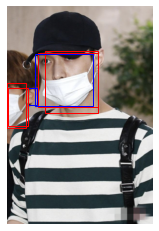

{'boxes': tensor([[0.0000e+00, 1.4121e+02, 3.3845e+01, 2.2342e+02],
        [6.9388e+01, 8.2258e+01, 1.6704e+02, 1.9486e+02],
        [5.5371e+01, 8.5336e+01, 1.6628e+02, 1.8450e+02],
        [3.6886e+01, 1.5009e+02, 5.4477e+01, 1.8035e+02],
        [5.0016e+01, 8.6833e+01, 1.5646e+02, 1.8260e+02],
        [1.6859e-01, 1.4901e+02, 3.7577e+01, 2.1962e+02]], device='cuda:0'), 'labels': tensor([2, 2, 3, 1, 1, 3], device='cuda:0'), 'scores': tensor([0.9768, 0.7065, 0.5556, 0.3414, 0.1723, 0.1230], device='cuda:0')}
{'boxes': tensor([[170.7865, 257.5700, 485.3932, 551.0800]], device='cuda:0'), 'labels': tensor([3], device='cuda:0'), 'image_id': tensor([835], device='cuda:0')}


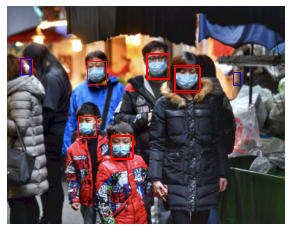

{'boxes': tensor([[101.2744, 156.7320, 128.0159, 188.1116],
        [199.7877,  66.3843, 231.9527, 103.6971],
        [113.8216,  77.9576, 142.2358, 110.9833],
        [240.1975,  83.5858, 276.0051, 122.1053],
        [148.5423, 184.9048, 179.7481, 218.5260],
        [ 19.5799,  73.5124,  34.4530,  97.4857],
        [149.1723, 186.4539, 180.1499, 217.5378],
        [324.9796,  93.8059, 334.7969, 112.9952],
        [240.6986,  86.6279, 277.2156, 119.7363],
        [200.1020,  68.1509, 232.7415, 103.0505],
        [ 18.6433,  74.6915,  34.5671,  96.7378],
        [ 18.4384,  73.9079,  34.2220,  97.0542]], device='cuda:0'), 'labels': tensor([2, 2, 2, 2, 2, 2, 3, 1, 3, 3, 3, 1], device='cuda:0'), 'scores': tensor([0.9911, 0.9905, 0.9861, 0.9784, 0.9681, 0.9177, 0.2046, 0.1260, 0.1031,
        0.0721, 0.0647, 0.0569], device='cuda:0')}
{'boxes': tensor([[615.7550, 224.9201, 707.7350, 311.8211],
        [383.2500, 475.3994, 457.3450, 557.1885],
        [255.5000, 403.8339, 319.3750, 472.8434

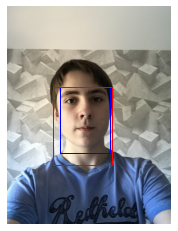

{'boxes': tensor([[ 95.7129, 148.5484, 189.4392, 269.4398],
        [ 84.0459, 148.1139, 192.2675, 290.5177]], device='cuda:0'), 'labels': tensor([1, 3], device='cuda:0'), 'scores': tensor([0.9769, 0.1285], device='cuda:0')}
{'boxes': tensor([[252.4917, 401.2825, 510.2990, 693.6075]], device='cuda:0'), 'labels': tensor([1], device='cuda:0'), 'image_id': tensor([837], device='cuda:0')}


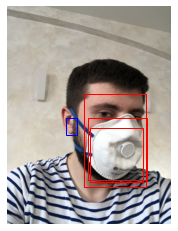

{'boxes': tensor([[140.9532, 160.9471, 254.6647, 331.0894],
        [151.3931, 223.0098, 248.6880, 321.9288],
        [148.3152, 205.0859, 256.9641, 319.6154],
        [106.9394, 205.1928, 127.0089, 235.9088]], device='cuda:0'), 'labels': tensor([2, 2, 3, 1], device='cuda:0'), 'scores': tensor([0.9690, 0.7884, 0.2358, 0.0659], device='cuda:0')}
{'boxes': tensor([[377.4086, 427.8575, 672.4252, 861.0300]], device='cuda:0'), 'labels': tensor([2], device='cuda:0'), 'image_id': tensor([838], device='cuda:0')}


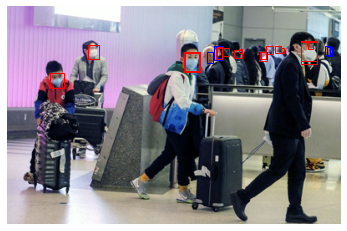

{'boxes': tensor([[ 51.0333,  79.1835,  68.1541,  97.4562],
        [212.0165,  54.4390, 230.4825,  78.5574],
        [352.0776,  41.5032, 371.5941,  68.4327],
        [ 97.0541,  46.1712, 109.7530,  63.0112],
        [302.2416,  54.3270, 311.9050,  65.1401],
        [250.5022,  48.4669, 257.0643,  60.9730],
        [310.3439,  47.2867, 319.0287,  57.2070],
        [271.3242,  51.4627, 281.4487,  61.8456],
        [320.6946,  47.1120, 328.7136,  55.9193],
        [302.3337,  54.4373, 310.8932,  62.2355],
        [250.6978,  48.9472, 257.9381,  62.5811],
        [381.5482,  47.6579, 387.1924,  58.3944],
        [383.2669,  48.3649, 389.5149,  58.5701],
        [251.2269,  48.3783, 257.7762,  63.1283],
        [256.8015,  50.0610, 265.5715,  59.2989],
        [303.0957,  54.4926, 310.2920,  63.1041],
        [328.2068,  49.8564, 331.2318,  55.7794],
        [351.9643,  41.9691, 370.9839,  64.7379],
        [278.2844,  50.8051, 281.8140,  55.7105],
        [239.5026,  54.5919, 246.6334,  

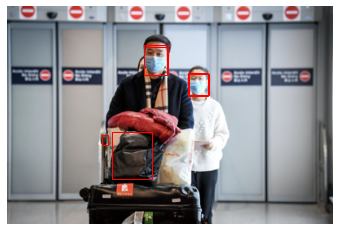

{'boxes': tensor([[221.9405,  81.7725, 245.8276, 109.9235],
        [168.0314,  48.9378, 195.2478,  83.2886],
        [128.4674, 153.4997, 177.0910, 211.4548],
        [167.3226,  47.3282, 197.2082,  83.9478],
        [115.7115, 157.3891, 122.8247, 169.8053],
        [222.3508,  82.6363, 247.1170, 108.7816]], device='cuda:0'), 'labels': tensor([2, 2, 2, 3, 2, 3], device='cuda:0'), 'scores': tensor([0.9928, 0.9859, 0.5947, 0.1992, 0.1484, 0.0523], device='cuda:0')}
{'boxes': tensor([[500.1650, 149.8127, 587.0200, 248.6891],
        [667.8849, 248.6891, 733.7750, 332.5843]], device='cuda:0'), 'labels': tensor([2, 2], device='cuda:0'), 'image_id': tensor([840], device='cuda:0')}


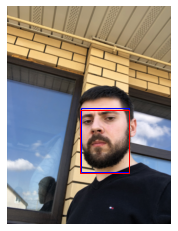

{'boxes': tensor([[135.8797, 186.4270, 223.7210, 303.6004],
        [133.1771, 190.3242, 223.2649, 306.3082]], device='cuda:0'), 'labels': tensor([1, 3], device='cuda:0'), 'scores': tensor([0.9699, 0.1921], device='cuda:0')}
{'boxes': tensor([[356.1462, 488.9800, 592.6910, 786.6200]], device='cuda:0'), 'labels': tensor([1], device='cuda:0'), 'image_id': tensor([841], device='cuda:0')}


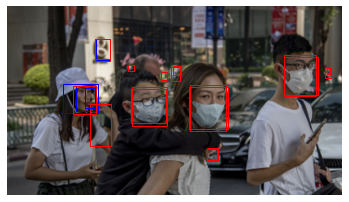

{'boxes': tensor([[330.3194,  57.3906, 368.4075, 106.8055],
        [ 81.1853,  95.0272, 104.2142, 124.6564],
        [148.7860,  95.8597, 190.4691, 142.7377],
        [216.7117,  95.7003, 262.7207, 145.4332],
        [194.6252,  72.3707, 205.9749,  88.1626],
        [238.2634, 168.7271, 250.8302, 183.8524],
        [105.0122,  38.8197, 122.5952,  62.9351],
        [218.3766,  93.5050, 261.1995, 148.7469],
        [ 66.5339,  92.4325, 107.4863, 127.3465],
        [143.4598,  69.9347, 150.7067,  76.7999],
        [104.7213,  38.1719, 122.5763,  62.6603],
        [237.7181, 169.3179, 250.2809, 182.3510],
        [ 98.2864, 116.3904, 123.5033, 165.9950],
        [197.2245,  70.2695, 206.7756,  81.3029],
        [379.7389,  73.0372, 386.6254,  84.5275],
        [104.8192,  38.3551, 122.0071,  64.0651],
        [330.3602,  59.2941, 370.4253, 105.5700],
        [381.3410,  73.4988, 385.6862,  80.6096],
        [ 91.9155,  96.6331, 105.9256, 121.2255],
        [147.4282,  97.8666, 189.2994, 1

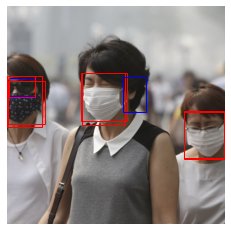

{'boxes': tensor([[3.2520e+02, 1.9418e+02, 4.0000e+02, 2.8104e+02],
        [1.3689e+02, 1.2118e+02, 2.1595e+02, 2.1861e+02],
        [0.0000e+00, 1.2781e+02, 6.4221e+01, 2.2101e+02],
        [1.3575e+02, 1.2250e+02, 2.1924e+02, 2.0977e+02],
        [5.7014e-02, 1.3660e+02, 6.8267e+01, 2.1629e+02],
        [2.1219e+02, 1.2962e+02, 2.5518e+02, 1.9407e+02],
        [3.2524e+02, 1.9176e+02, 3.9886e+02, 2.7878e+02],
        [2.5974e+00, 1.3127e+02, 5.1003e+01, 1.6500e+02],
        [2.1193e+00, 1.2781e+02, 5.1212e+01, 1.6642e+02]], device='cuda:0'), 'labels': tensor([2, 2, 2, 3, 3, 1, 3, 1, 3], device='cuda:0'), 'scores': tensor([0.9792, 0.9644, 0.9525, 0.2618, 0.2005, 0.1697, 0.0960, 0.0910, 0.0722],
       device='cuda:0')}
{'boxes': tensor([[  2., 264., 118., 430.],
        [278., 256., 448., 420.],
        [662., 410., 800., 554.]], device='cuda:0'), 'labels': tensor([2, 2, 2], device='cuda:0'), 'image_id': tensor([843], device='cuda:0')}


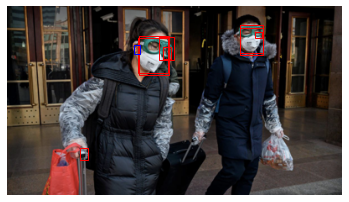

{'boxes': tensor([[277.5936,  21.3970, 305.3239,  56.9648],
        [156.3992,  35.3617, 192.4008,  80.9328],
        [ 86.1804, 168.0187,  96.1996, 182.3692],
        [155.9724,  36.8891, 192.1630,  79.1434],
        [180.9116,  35.7130, 198.6715,  63.0387],
        [185.6656,  48.1750, 195.6949,  62.6290],
        [278.1609,  24.9716, 304.7040,  54.5427],
        [296.0451,  29.8959, 303.6319,  37.3102],
        [151.1465,  45.1837, 157.8255,  56.0074]], device='cuda:0'), 'labels': tensor([2, 2, 2, 3, 2, 2, 3, 2, 1], device='cuda:0'), 'scores': tensor([0.9389, 0.8008, 0.3883, 0.3406, 0.2315, 0.2246, 0.1135, 0.0763, 0.0567],
       device='cuda:0')}
{'boxes': tensor([[ 523.2025,  129.8267,  656.5025,  272.9689],
        [ 923.1025,   79.8933, 1016.4125,  186.4178]], device='cuda:0'), 'labels': tensor([2, 2], device='cuda:0'), 'image_id': tensor([844], device='cuda:0')}


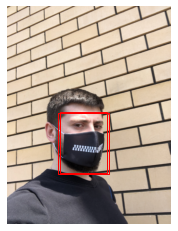

{'boxes': tensor([[ 96.5108, 193.1180, 183.0850, 306.0419],
        [ 93.0484, 195.6715, 186.0998, 307.7017]], device='cuda:0'), 'labels': tensor([2, 3], device='cuda:0'), 'scores': tensor([0.9906, 0.0630], device='cuda:0')}
{'boxes': tensor([[268.4385, 523.5275, 478.4053, 813.1950]], device='cuda:0'), 'labels': tensor([2], device='cuda:0'), 'image_id': tensor([845], device='cuda:0')}


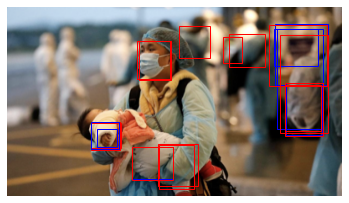

{'boxes': tensor([[156.7834,  40.6967, 194.7199,  87.2594],
        [319.0840,  20.4124, 383.1826,  93.0500],
        [332.7170,  90.6935, 375.9226, 153.2501],
        [257.6841,  35.9441, 280.0287,  66.3916],
        [106.4451, 145.7934, 130.3837, 167.5111],
        [264.4975,  32.7432, 306.9261,  71.8266],
        [322.0016,  25.6904, 377.2794, 145.5546],
        [180.7641, 164.7726, 223.0201, 216.9920],
        [331.4108,  90.9779, 377.3885, 154.5532],
        [205.1754,  23.0010, 241.6037,  60.7978],
        [317.6858,  26.5909, 370.3819,  70.7091],
        [325.3586,  33.4659, 382.9031, 150.3816],
        [154.9584,  40.6423, 194.4034,  86.3650],
        [312.5835,  20.8453, 381.4992,  94.8951],
        [149.0303, 166.9615, 197.5517, 205.2188],
        [ 99.7566, 136.9305, 134.4198, 170.7936],
        [ 99.7893, 138.7534, 135.4057, 168.1197],
        [ 99.8815, 137.2804, 133.0487, 169.3119],
        [179.3212, 163.8594, 227.9647, 213.2785],
        [331.6481,  92.7389, 374.9160, 1

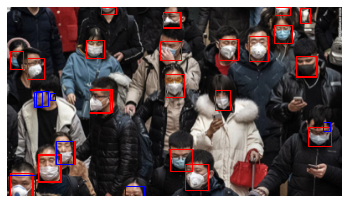

{'boxes': tensor([[ 22.8897,  61.1163,  43.2154,  86.3505],
        [212.2248, 187.7801, 239.4007, 218.4662],
        [252.8575,  38.6647, 275.3792,  63.5660],
        [247.1820,  98.9961, 265.8170, 122.6277],
        [288.2016,  35.1123, 311.3719,  64.1746],
        [194.0303, 169.0235, 219.7699, 196.0976],
        [318.3511,  21.6799, 339.2263,  42.4079],
        [181.4956,  40.0859, 207.1782,  62.8703],
        [187.6618,  80.3000, 210.8791, 107.8068],
        [344.5930,  59.0272, 368.6268,  83.5974],
        [ 93.4525,  38.9328, 115.7219,  61.0184],
        [ 96.6996,  99.5264, 122.6952, 126.1807],
        [ 33.3743, 100.5866,  47.7193, 118.5688],
        [  2.9682,  53.0850,  18.5195,  74.0087],
        [358.8853, 143.8044, 386.0201, 166.4258],
        [186.0538,   5.9741, 206.1177,  24.7574],
        [ 36.1769, 177.1027,  62.9031, 208.1331],
        [140.3506, 213.5503, 162.7544, 226.0000],
        [  2.8811, 198.7887,  28.9399, 226.0000],
        [348.8449,   0.7206, 361.6055,  

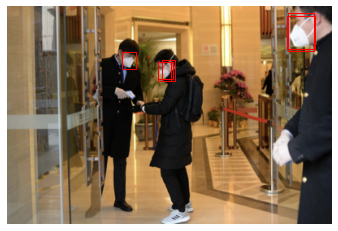

{'boxes': tensor([[141.5169,  56.2986, 157.8813,  76.7033],
        [185.1807,  68.4515, 201.8509,  90.8922],
        [345.7301,   7.4242, 377.2439,  54.6399],
        [344.0963,  10.9971, 379.3225,  51.7242],
        [190.9070,  65.6322, 205.7685,  91.8023],
        [185.8569,  68.5553, 203.8025,  88.5948]], device='cuda:0'), 'labels': tensor([2, 2, 2, 3, 2, 3], device='cuda:0'), 'scores': tensor([0.9906, 0.9750, 0.9133, 0.2421, 0.0725, 0.0653], device='cuda:0')}
{'boxes': tensor([[ 420.8850,  173.1343,  474.6150,  232.8358],
        [ 555.2100,  217.9104,  599.9850,  262.6866],
        [1038.7799,   23.8806, 1125.3450,  161.1940],
        [1062.6599,  226.8657, 1077.5850,  250.7463]], device='cuda:0'), 'labels': tensor([2, 2, 2, 2], device='cuda:0'), 'image_id': tensor([848], device='cuda:0')}


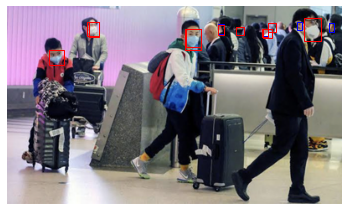

{'boxes': tensor([[ 49.6359,  52.1151,  66.8683,  70.0020],
        [212.5099,  26.6418, 231.3562,  51.2645],
        [354.6314,  14.0869, 374.1102,  40.5650],
        [ 96.6583,  18.1973, 109.1516,  35.9443],
        [272.2810,  24.5615, 282.2913,  33.6190],
        [251.3414,  20.9936, 258.1866,  33.1321],
        [311.6503,  19.6135, 320.2661,  29.7181],
        [384.2226,  19.5504, 390.0004,  30.7177],
        [305.2638,  26.8905, 311.5640,  34.4903],
        [ 94.9504,  18.3028, 108.9862,  34.9137],
        [346.0844,  18.3165, 351.7797,  27.2977],
        [251.2804,  22.4131, 258.5721,  33.9650],
        [305.1440,  27.2058, 316.4279,  37.6757],
        [304.2898,  26.3573, 311.5274,  36.0929],
        [212.5857,  27.1178, 231.0310,  48.6169]], device='cuda:0'), 'labels': tensor([2, 2, 2, 2, 2, 1, 2, 1, 1, 3, 1, 3, 2, 2, 3], device='cuda:0'), 'scores': tensor([0.9952, 0.9876, 0.9874, 0.9752, 0.6227, 0.4306, 0.3721, 0.1486, 0.1307,
        0.1161, 0.1040, 0.0958, 0.0675, 0.0554, 0

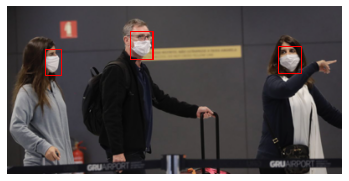

{'boxes': tensor([[323.6052,  46.8149, 350.4394,  79.5802],
        [ 44.5292,  49.9981,  63.6397,  81.6491],
        [146.7992,  29.1214, 173.4548,  62.0491],
        [145.9285,  28.8101, 172.9538,  61.8732]], device='cuda:0'), 'labels': tensor([2, 2, 2, 3], device='cuda:0'), 'scores': tensor([0.9973, 0.9962, 0.9916, 0.0708], device='cuda:0')}
{'boxes': tensor([[ 153.2950,  173.1600,  213.2800,  269.7300],
        [ 486.5450,   99.9000,  586.5200,  199.8000],
        [1076.3975,  156.5100, 1169.7075,  259.7400]], device='cuda:0'), 'labels': tensor([2, 2, 2], device='cuda:0'), 'image_id': tensor([850], device='cuda:0')}


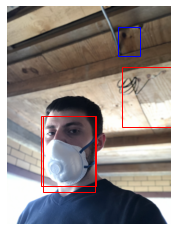

{'boxes': tensor([[ 65.5193, 201.9557, 160.8570, 340.5505],
        [203.5369,  38.1047, 244.7094,  90.6547],
        [211.3395, 111.7930, 301.0000, 222.0065],
        [ 62.5793, 200.3854, 162.1458, 330.4888]], device='cuda:0'), 'labels': tensor([2, 1, 2, 3], device='cuda:0'), 'scores': tensor([0.9767, 0.1007, 0.0917, 0.0687], device='cuda:0')}
{'boxes': tensor([[175.4153, 544.7875, 414.6180, 876.9750]], device='cuda:0'), 'labels': tensor([2], device='cuda:0'), 'image_id': tensor([851], device='cuda:0')}


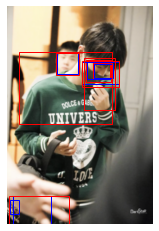

{'boxes': tensor([[ 91.8608,  84.7004, 130.4341, 123.9222],
        [145.6121,  99.9099, 189.0536, 134.0336],
        [  9.4252, 347.7112,  80.4632, 399.5069],
        [145.3627,  98.5340, 189.9936, 137.7895],
        [157.6144, 104.5324, 188.8345, 131.7057],
        [158.5215, 105.7112, 193.7641, 131.5877],
        [  5.2546, 356.5088,  20.7888, 381.6606],
        [ 88.8213,  85.0624, 131.1978, 124.9171],
        [ 21.7417,  83.7840, 193.0395, 215.6091],
        [137.1287, 101.9370, 204.8036, 143.0324],
        [137.2733, 100.6450, 205.2040, 147.8662],
        [  3.2467, 348.5135, 114.0452, 400.0000],
        [140.1784,  94.9086, 198.3808, 190.8210]], device='cuda:0'), 'labels': tensor([1, 1, 1, 3, 3, 1, 1, 3, 2, 1, 2, 3, 2], device='cuda:0'), 'scores': tensor([0.9802, 0.4405, 0.2737, 0.1903, 0.1488, 0.1290, 0.1234, 0.1154, 0.1055,
        0.0876, 0.0688, 0.0675, 0.0558], device='cuda:0')}
{'boxes': tensor([[416.4794, 281.5300, 593.2584, 440.2650],
        [275.6554, 257.5700, 395.505

In [27]:
model4 = get_model_instance_segmentation(3)
model4.load_state_dict(torch.load('saves/final_run/model_2_epochs.pt'))
model4.eval()
model4.to(device)

iou_vals = []

TP = 0
FP = 0
TN = 0
FN = 0

with torch.no_grad():
    for imgs, annotations in val_data_loader:
        imgs = list(img.to(device) for img in imgs)
        annotations = [{k: v.to(device) for k, v in t.items()} for t in annotations]
        pred = model4(imgs, annotations)
        
        
        for i in range(len(annotations)):
            plot_image_new(imgs[i], pred[i])
            print(pred[i])
            print(annotations[i])
# #             if len(pred[i]['labels']) == 0:
# #                 FN += len(pred[i]['labels'])
#             match_count = 0
#             for ground_truth_box in annotations[i]['boxes']:                                 
#                 for idx,label in enumerate(pred[i]['labels']):
#                     val = get_iou(pred[i]['boxes'][idx], ground_truth_box)
#                     if val>0:
#                         print(label, val)
#                     if (label == 2 or label==3) and val>0.1:
# #                         print('IOU:', val)
#                         match_count += 1
#                         break
# #                             iou_vals.append(val)
# #                         if not flag:
# #                             print('IOU:', val)
# #                             plot_image_new(imgs[i], pred[i])    
#             TP += match_count
# #             print(match_count)
#             if match_count > len(annotations[i]['boxes']):
#                 FP += match_count-len(annotations[i]['boxes'])
# #             elif match_count < len(annotations[i]['boxes']):
# #                 FN += len(annotations[i]['boxes'])-match_count

#         break
# print('Precision:', 1.0*TP/(TP+FP))
# print('Avg IOU score: ', np.mean(iou_vals))

In [20]:
len(val_data_loader)

43

In [ ]:
# print([val.detach().cpu().numpy() for val in iou_vals])